In [1]:
using Random, Statistics, Plots, ProgressMeter, JSON, StatsBase, Distributions, GLM, LaTeXStrings, SplitApplyCombine, StatsPlots

In [2]:
### Save data to file ###

function save_to_file(file::Any, name::String, vec_of_vec::Bool)
    open(string(name), "w") do io
        if vec_of_vec      
            for mi in file
                println(io, join(mi, ", "))  # comma-separated values
            end
        else
            for mi in file
                println(io, mi)  # comma-separated values
            end
        end
    end
end

save_to_file (generic function with 1 method)

# Structures

## Chromosomes

In [3]:
# Chromosomes Type and Functions
# -------------------------------
mutable struct Chromosomes
#    chromosomes_gene_type::Vector{Vector{Int}}
    chromosomes_gene_mut::Vector{Vector{Int}}
    gene_map::Dict{Int,String}
end

function get_Nchrs(ch::Chromosomes)
    return length(ch.chromosomes_gene_mut)
end

function get_Ngenes(ch::Chromosomes)
    ngenes = 0
    if length(ch.chromosomes_gene_type) == length(ch.chromosomes_gene_mut)
        for i in 1:length(ch.chromosomes_gene_type)
            if length(ch.chromosomes_gene_type[i]) == length(ch.chromosomes_gene_mut[i])
                ngenes = ngenes+length(ch.chromosomes_gene_type[i])
            else
                error("Mismatched genes lenghts")
            end
        end
        return ngenes
    else
        error("Mismatched chromosome lists.")
    end
end

function mutate!(ch::Chromosomes, mu::Float64)
    n_mut = 0
    for i in 1:get_Nchrs(ch)
        chrom = copy(ch.chromosomes_gene_mut[i])
        # For each gene in the chromosome, mutate with probability mu.
        for j in 1:length(chrom)
            if rand() < mu
                chrom[j] = 1
            end
        end
        ch.chromosomes_gene_mut[i] = copy(chrom)
    end
end

function get_genes_by_type(ch::Chromosomes, gene_type::String)
#    restr_gene_mut_gt = Vector{Vector{Int}}()
    restr_gene_mut_gm = Vector{Vector{Int}}()
    for i in 1:length(ch.chromosomes_gene_mut)
        mapped = [ch.gene_map[x] for x in 1:length(ch.chromosomes_gene_mut[i])]
        inds = findall(x -> x == gene_type, mapped)
#        push!(restr_gene_mut_gt, ch.chromosomes_gene_type[i][inds])
        push!(restr_gene_mut_gm, ch.chromosomes_gene_mut[i][inds])
    end
    return restr_gene_mut_gm #restr_gene_mut_gt, 
end


get_genes_by_type (generic function with 1 method)

## Cell

In [4]:
# Cell Type and Methods
# ---------------------
mutable struct Cell
    x::Int
    y::Int
    chromosomes::Chromosomes
    state::Int
    mu0::Float64
    dmu::Float64
    mu::Float64
    r0::Float64
    dr::Float64
    rmax::Float64
    r::Float64
    dm::Float64
    m::Float64
end

get_Nchrs(cell::Cell) = get_Nchrs(cell.chromosomes)

function dead_cell(x::Int, y::Int)
    return Cell(x,y,Chromosomes([], Dict()),2,0,0,0,0,0,0,0,0,0)
end
"""
    compute_activation(cell, gene_type; mode="any")

Helper function that computes, for a given gene type, an activation Boolean vector
across the unique genes. For mode "any", a gene is activated if at least one chromosome
has it mutated; for mode "all", only if all chromosomes show the mutation.
"""
function compute_activation(cell::Cell, gene_type::String; mode::String="any")
    gene_muts = get_genes_by_type(cell.chromosomes, gene_type)
    #if all(x -> isempty(x), gene_types)
    #    return Bool[]
    #end
    #unique_genes = unique(vcat(gene_types...))
    # For each chromosome, build a Boolean vector indicating for each unique gene if any matching gene is mutated.
    activation = [ [ gene_muts[i][j]==1 for j in 1:length(gene_muts[i]) ] for i in 1:length(gene_muts) ]
    if mode == "any"
        # A gene is activated if any chromosome shows it.
        return [ any(activation[i][j] for i in 1:length(activation)) for j in 1:length(gene_muts[1]) ]
    elseif mode == "all"
        # A gene is activated only if every chromosome shows it.
        return [ all(activation[i][j] for i in 1:length(activation)) for j in 1:length(gene_muts[1]) ]
    else
        error("Invalid mode. Use \"any\" or \"all\".")
    end
end

function update_mu!(cell::Cell)
    act = compute_activation(cell, "I"; mode="all")
    cell.mu = cell.mu0 + sum(act) * cell.dmu
end

function update_r!(cell::Cell)
    act_o = compute_activation(cell, "O"; mode="any")
    act_s = compute_activation(cell, "S"; mode="all")
    new_r = cell.r0 + (sum(act_o) + sum(act_s)) * cell.dr
    cell.r = new_r < cell.rmax ? new_r : cell.rmax
end

function update_m!(cell::Cell)
    act_m = compute_activation(cell, "M"; mode="all")
    cell.m = sum(act_m) * cell.dm
end


function check_cell_death(cell::Cell)
    if length(cell.chromosomes.chromosomes_gene_mut) == 0
        return true
    elseif cell.state!=0 && cell.mu==0.
        return true
    elseif get_Nchrs(cell)>5
        return true
    elseif any(compute_activation(cell, "HK"; mode="all"))
        return true
    else
        return false
    end
end

"""
    update!(cell)

Updates the cell state: first checks for cell death, then applies mutation, and updates
the mutation and reproduction rates. Returns 0 if the cell dies, 1 if it reproduces,
or 2 if nothing happens.
"""
function sample_reproducers(rates::Vector{Float64})
    R = sum(rates)
    K = rand(Poisson(R))

    # if no events, short‐circuit:
    if K == 0
        return falses(length(rates)), zeros(Int, length(rates))
    end

    # pick K events (with replacement) weighted by rates:
    events = sample(1:length(rates), Weights(rates), K; replace=false)

    # tabulate
    counts = zeros(Int, length(rates))
    for i in events
        counts[i] += 1
    end
    reproduced = counts .> 0
    return reproduced, events
end


function copy_cell(cell::Cell)
    new_chromosomes = Chromosomes([copy(arr) for arr in cell.chromosomes.chromosomes_gene_mut],cell.chromosomes.gene_map)
    return Cell(cell.x, cell.y, new_chromosomes, cell.state, cell.mu0, cell.dmu, cell.mu, 
                cell.r0, cell.dr, cell.rmax, cell.r, cell.dm, cell.m)
end

copy_cell (generic function with 1 method)

## Tissue

In [5]:
# Tissue Type and Functions
# -------------------------
mutable struct Tissue
    L::Int
    cells::Array{Cell,2}
    gene_map::Dict{Int,String}
    neighbor_cache::Dict{Tuple{Int,Int}, Vector{Tuple{Int,Int}}}
end

function compute_neighbors(L::Int, row::Int, col::Int)
    neighbors = Vector{Tuple{Int,Int}}()
    for dr in -1:1
        for dc in -1:1
            if dr == 0 && dc == 0
                continue
            end
            new_row = row + dr
            new_col = col + dc
            if new_row ≥ 1 && new_row ≤ L && new_col ≥ 1 && new_col ≤ L
                push!(neighbors, (new_row, new_col))
            end
        end
    end
    return neighbors
end

function Tissue(L::Int, init_cell_state::Array{Cell,2})
    gene_map = init_cell_state[1,1].chromosomes.gene_map
    neighbor_cache = Dict{Tuple{Int,Int}, Vector{Tuple{Int,Int}}}()
    for i in 1:L, j in 1:L
        neighbor_cache[(i,j)] = compute_neighbors(L, i, j)
    end
    return Tissue(L, init_cell_state, gene_map, neighbor_cache)
end

get_neighbors(tiss::Tissue, row::Int, col::Int) = tiss.neighbor_cache[(row, col)]

function initialize_tiss_indx!(tiss::Tissue)
    for i in 1:tiss.L, j in 1:tiss.L
        tiss.cells[i,j].x = i
        tiss.cells[i,j].y = j
    end
end

function get_idx(tiss::Tissue)
    idx = zeros(Int, tiss.L, tiss.L)
    for i in 1:tiss.L, j in 1:tiss.L
        idx[i,j] = (tiss.cells[i,j].x) + (tiss.L*(tiss.cells[i,j].y-1))
    end
    return idx
end

function copy_tissue(orig::Tissue)
    L = orig.L
    # Deep-copy every cell
    newcells = [ copy_cell(orig.cells[i,j]) for i in 1:L, j in 1:L ]
    # Rebuild a fresh Tissue (this will re-extract gene_map and rebuild neighbor_cache)
    return Tissue(L, newcells)
end

# Tissue Initialization
# --------------------
function init_tissue(L::Int, chrom_gene_mut::Vector{Vector{Int}}, 
    gene_map::Dict{Int,String}, 
    mu0::Float64, dmu::Float64, 
    r0::Float64, dr::Float64, rmax::Float64, dm::Float64)
    cells = Array{Cell}(undef, L, L)
    for i in 1:L, j in 1:L
        ch = Chromosomes(copy(chrom_gene_mut), gene_map)
        cells[i,j] = Cell(i, j, ch, 0, mu0, dmu, mu0,
                                    r0, dr, rmax, r0, dm, 0)
    end
    return Tissue(L, cells)
end

# Perturbation of the initial state
# ---------------------------------
function perturb_init_tissue!(tiss::Tissue, r::Float64, pert_chrom_gene_mut::Vector{Vector{Int}})
    for i in 1:L
        for j in 1:L
            if (i-L//2)^2+(j-L//2)^2 <= (r*L)^2
                tiss.cells[i,j].chromosomes.chromosomes_gene_mut = copy(pert_chrom_gene_mut)
                tiss.cells[i,j].state=1
                update_mu!(tiss.cells[i,j])
                update_r!(tiss.cells[i,j])
                update_m!(tiss.cells[i,j])
            end
        end
    end
end


perturb_init_tissue! (generic function with 1 method)

In [6]:
### Tissue update ###

# Helper function for weighted random selection.
function weighted_choice(neighbors::Vector{Tuple{Int,Int}}, weights::Vector{Float64})
    total = sum(weights)
    r = rand() * total
    cum = 0.0
    for (i, w) in enumerate(weights)
        cum += w
        if r < cum
            return neighbors[i]
        end
    end
    return neighbors[end]
end

# Helper function to sample an integer from a power law distribution.
function sample_powerlaw_int(min_length::Int, max_length::Int, alpha::Float64)
    # Generate a uniform random number between 0 and 1.
    u = rand()
    # Inverse transform sampling for a power law:
    #   F(x) = (x^(1-α) - min_length^(1-α)) / (max_length^(1-α) - min_length^(1-α))
    # Solving for x gives:
    x = ((u * (max_length^(1 - alpha) - min_length^(1 - alpha))) + min_length^(1 - alpha))^(1 / (1 - alpha))
    # Ensure the returned length is at least min_length and at most max_length.
    slice_length = max(min_length, min(max_length, round(Int, x)))
    return slice_length
end


# small helper to finish off a cell after placement
function _finalize!(cell::Cell, dead_pos::Vector{Tuple{Int,Int}}, i::Int, j::Int, n_chrs::Int)
    mutate!(cell.chromosomes, cell.mu)
    if cell.state == 0
        if get_Nchrs(cell)!=n_chrs
            cell.state=1
        elseif sum(sum(cell.chromosomes.chromosomes_gene_mut))!=0
            cell.state=1
        end
    end
    
    if check_cell_death(cell)
        push!(dead_pos, (i,j))
    else
        update_mu!(cell)
        update_r!(cell)
        update_m!(cell)
    end
end

# exchange of chromosome from mother to daugther during replication
function _combine!(cell_mother::Cell, i::Int, j::Int, cell_daughter::Cell, ci::Int, cj::Int, dead_pos::Vector{Tuple{Int,Int}})
    if rand()<cell_mother.m && length(cell_mother.chromosomes.chromosomes_gene_mut)>0
        i = sample(1:get_Nchrs(cell_mother))
        chunk = popat!(cell_mother.chromosomes.chromosomes_gene_mut, i)
        push!(cell_daughter.chromosomes.chromosomes_gene_mut, deepcopy(chunk))
    end

    if check_cell_death(cell_mother) # if the cell has 0 chromosomes dies
        push!(dead_pos, (i,j))
    end
    
    if check_cell_death(cell_daughter) # if the cell has 0 chromosomes dies
        push!(dead_pos, (ci,cj))
    end 
    
    return nothing
end


# HUGE FUNCTION for the cell lattice update
function substitute!(tiss::Tissue, n_chrs::Int)
    L = tiss.L
    dead_pos = Vector{Tuple{Int,Int}}()
    # 1) reproducing cells (action == 1)
    repro_positions = findall(reshape(sample_reproducers(vec(get_r(tiss)))[1],tiss.L,tiss.L).==1)
    
    if length(repro_positions)>1
        for idx in eachindex(repro_positions)
            pos = repro_positions[idx]
            i,j = Tuple(pos)            # unpack the CartesianIndex
            cell = tiss.cells[i,j]
    
            # pick neighbor once
            neighs = get_neighbors(tiss, i, j)
            states = [ tiss.cells[r,c].state for (r,c) in neighs ]
            if !all(states.==0)
                rates = [ tiss.cells[r,c].r for (r,c) in neighs ]
                if any(rates.==0.)
                    ci, cj = neighs[rand(findall(rates.==0.))]
                else
                    inv_rates = 1.0 ./ rates
                    ci, cj = weighted_choice(neighs, inv_rates)
                end
                
                ############################################
                copyc = copy_cell(cell)
                tiss.cells[ci,cj] = copyc
                _finalize!(tiss.cells[i,j], dead_pos, i, j, n_chrs)
                _finalize!(tiss.cells[ci,cj], dead_pos, ci, cj, n_chrs)
                _combine!(tiss.cells[i,j],i,j,tiss.cells[ci,cj],ci,cj,dead_pos)
                #############################################
            end
        end

        for pos in dead_pos
            i,j = Tuple(pos)
            tiss.cells[i,j] = dead_cell(i,j)
        end
    end
end





substitute! (generic function with 1 method)

In [7]:
### Exctract important quantities ###


### GROWTH RATE ###
function get_r(tiss::Tissue)
    r_mat = zeros(Float64, tiss.L, tiss.L)
    for i in 1:tiss.L, j in 1:tiss.L
        r_mat[i, j] = tiss.cells[i,j].r
    end
    return r_mat
end

function get_r_canc(tiss::Tissue)
    r_mat = Float64[]
    for i in 1:tiss.L, j in 1:tiss.L
        if tiss.cells[i,j].state==1
            push!(r_mat, tiss.cells[i,j].r)
        end
    end
    return mean(r_mat)
end

### MUTATION RATE ###
function get_mu(tiss::Tissue)
    mu_mat = zeros(Float64, tiss.L, tiss.L)
    for i in 1:tiss.L, j in 1:tiss.L
        mu_mat[i, j] = tiss.cells[i,j].mu
    end
    return mu_mat
end

function get_mu_canc(tiss::Tissue)
    mu_mat = Float64[]
    for i in 1:tiss.L, j in 1:tiss.L
        if tiss.cells[i,j].state==1
            push!(mu_mat, tiss.cells[i,j].mu)
        end
    end
    return mean(mu_mat)
end

### MISSEGREGATION RATE ###
function get_m(tiss::Tissue)
    m_mat = zeros(Float64, tiss.L, tiss.L)
    for i in 1:tiss.L, j in 1:tiss.L
        m_mat[i, j] = tiss.cells[i,j].m
    end
    return m_mat
end

function get_m_canc(tiss::Tissue)
    m_mat = Float64[]
    for i in 1:tiss.L, j in 1:tiss.L
        if tiss.cells[i,j].state==1
            push!(m_mat, tiss.cells[i,j].m)
        end
    end
    return mean(m_mat)
end


### NUMBER OF CHROMOSOMES ###
function get_Nchrs(tiss::Tissue)
    n_mat = zeros(Float64, tiss.L, tiss.L)
    for i in 1:tiss.L, j in 1:tiss.L
        n_mat[i, j] = length(tiss.cells[i,j].chromosomes.chromosomes_gene_mut)
    end
    return n_mat
end

function get_Nchrs_canc(tiss::Tissue)
    n_mat = Float64[]
    for i in 1:tiss.L, j in 1:tiss.L
        if tiss.cells[i,j].state==1
            push!(n_mat, length(tiss.cells[i,j].chromosomes.chromosomes_gene_mut))
        end
    end
    return mean(n_mat)
end

### DENSITY OF CANCER CELLS ###
function get_cancercells(tiss::Tissue)
    n_mat = zeros(Int, tiss.L, tiss.L)
    for i in 1:tiss.L, j in 1:tiss.L
        n_mat[i, j] = tiss.cells[i,j].state
    end
    return sum(n_mat.==1)/tiss.L^2, sum(n_mat.==2)/tiss.L^2
end

### STATE OF EACH CELL ###
function get_state(tiss::Tissue)
    n_mat = zeros(Int, tiss.L, tiss.L)
    for i in 1:tiss.L, j in 1:tiss.L
        n_mat[i, j] = tiss.cells[i,j].state
    end
    return n_mat
end


### AVERGAGE GENE TYPE MUTATION ###
function get_avg_genemutation(tiss::Tissue, gene_types::Vector{String})
    # Determine keys (indices) of genes matching the provided gene_types.
    selected_keys = Int[]
    for gt in gene_types
        for (k, v) in tiss.gene_map
            if v == gt
                push!(selected_keys, k)
            end
        end
    end
    selected_keys = unique(selected_keys)
    
    # Create an output matrix filled with NaN.
    mut_state = fill(NaN, tiss.L, tiss.L)
    
    for i in 1:tiss.L, j in 1:tiss.L
        cell = tiss.cells[i,j]
        if get_Nchrs(cell) == 0
            mut_state[i,j] = NaN
        else
            means = Float64[]
            for c in 1:length(cell.chromosomes.chromosomes_gene_mut)
                # Get the gene types and mutation values for chromosome c.
            #    gene_types_vec = cell.chromosomes.chromosomes_gene_type[c]
                gene_mut_vec = cell.chromosomes.chromosomes_gene_mut[c]
                # Find indices where the gene type is one of the selected keys.
            #    idxs = findall(x -> x in selected_keys, gene_types_vec)
                #if !isempty(idxs)
                push!(means, mean(gene_mut_vec[selected_keys]))#[idxs]))
                #end
            end
            mut_state[i,j] = mean(means)
        end
    end
    return mut_state
end

function get_avg_genemutation_mean(tiss::Tissue, gene_types::Vector{String})
    # Determine keys (indices) of genes matching the provided gene_types.
    selected_keys = Int[]
    for gt in gene_types
        for (k, v) in tiss.gene_map
            if v == gt
                push!(selected_keys, k)
            end
        end
    end
    selected_keys = unique(selected_keys)
    
    # Create an output matrix filled with NaN.
    mut_state = Float64[]
    
    for i in 1:tiss.L, j in 1:tiss.L
        cell = tiss.cells[i,j]
        if cell.state==1
            means = Float64[]
            for c in 1:length(cell.chromosomes.chromosomes_gene_mut)
                # Get the gene types and mutation values for chromosome c.
                #gene_types_vec = cell.chromosomes.chromosomes_gene_type[c]
                gene_mut_vec = cell.chromosomes.chromosomes_gene_mut[c]
                # Find indices where the gene type is one of the selected keys.
                #idxs = findall(x -> x in selected_keys, gene_types_vec)
                #if !isempty(idxs)
                push!(means, mean(gene_mut_vec[selected_keys]))
                #end
            end
            push!(mut_state, mean(means))
        end
    end
    return mean(mut_state), std(mut_state)
end


##### ACTIVATION #####
function get_activation_pergene(tiss::Tissue, gene_type::String, mode::String)
    
    # Create an output matrix filled with NaN.
    mut_state = fill(NaN, tiss.L, tiss.L)
    
    for i in 1:tiss.L, j in 1:tiss.L
        cell = tiss.cells[i,j]
        if get_Nchrs(cell) == 0
            mut_state[i,j] = NaN
        else
            mut_state[i,j] = sum(compute_activation(cell, gene_type; mode=mode))
        end
    end
    return mut_state
end

function get_activation_pergene_canc(tiss::Tissue, gene_type::String, mode::String)
    
    # Create an output matrix filled with NaN.
    mut_state = Float64[]
    
    for i in 1:tiss.L, j in 1:tiss.L
        cell = tiss.cells[i,j]
        if cell.state==1
            if get_Nchrs(cell) != 0
                push!(mut_state, sum(compute_activation(cell, gene_type; mode=mode)))
            end
        end
    end
    return mean(mut_state), std(mut_state)
end

###### NUMBER OF NOT MUTATED GENES #########

function get_nomutgenes(tiss::Tissue, gene_types::Vector{String})
    # Determine keys (indices) of genes matching the provided gene_types.
    selected_keys = Int[]
    for gt in gene_types
        for (k, v) in tiss.gene_map
            if v == gt
                push!(selected_keys, k)
            end
        end
    end
    selected_keys = unique(selected_keys)
    
    # Create an output matrix filled with NaN.
    mut_state = fill(NaN, tiss.L, tiss.L)
    
    for i in 1:tiss.L, j in 1:tiss.L
        cell = tiss.cells[i,j]
        if get_Nchrs(cell) != 0
            v = sum(hcat([(chi[selected_keys].-1).*-1 for chi in cell.chromosomes.chromosomes_gene_mut]))
            mut_state[i,j] = length(v[v.==1])
        end
    end
    return mut_state
end


function get_nomutgenes_mean(tiss::Tissue)
    # Create an output matrix filled with NaN.
    mut_state = Float64[]
    
    for i in 1:tiss.L, j in 1:tiss.L
        cell = tiss.cells[i,j]
        if cell.state==1 && length(cell.chromosomes.chromosomes_gene_mut)>0
            v = sum(hcat([(chi[36:45].-1).*-1 for chi in cell.chromosomes.chromosomes_gene_mut]))
            nvirg = length(v[v.==1])
            nvirg_2 = length(v[v.==2])
            push!(mut_state, 1-(1-cell.mu)^nvirg*(1-cell.mu^2)^nvirg_2)
        end
    end
    return mut_state
end

get_nomutgenes_mean (generic function with 1 method)

# Simulation

## Functions

In [8]:
# Create Gene Map 
# ---------------

function create_gene_map(n_I::Int, n_O::Int, n_S::Int, n_M::Int, n_HK::Int)
    types = vcat(fill("I", n_I), fill("O", n_O), fill("S", n_S), fill("M", n_M), fill("HK", n_HK))
    return Dict(i => types[i] for i in 1:length(types))
end

create_gene_map (generic function with 1 method)

In [9]:
# Simulation loop

mutable struct Results
    state::String
    mu::Vector{Float64}
    r::Vector{Float64}
    m::Vector{Float64}
    n_chrs::Vector{Float64}
    tumor_density::Vector{Float64}
    dcells_density::Vector{Float64}
    tissues::Vector{Tissue}
    muts::Vector{Vector{Float64}}
    activations::Vector{Vector{Float64}}
    I_populations_density::Vector{Vector{Float64}}
end

function simulation(tiss::Tissue, n_chr::Int, n_steps::Int, n_it_store::Int, track_state::Bool, bar=true, limit=0.5)
    ##
    res = Results(
    "",                         ## state
    Float64[],                  ## mu
    Float64[],                  ## r
    Float64[],                  ## m
    Float64[],                  ## chrs
    Float64[],                  ## tumor
    Float64[],                  ## dcells
    Tissue[],                   ## tissues
    Vector{Vector{Float64}}(),  ## muts
    Vector{Vector{Float64}}(),  ## acts
    Vector{Vector{Float64}}())  ## pop_dens
    
    res.state = "Done"
    
    @showprogress enabled=bar for k in 1:n_steps
        substitute!(tiss, n_chr)  # Update system stat
        # Save important quantities
        push!(res.mu, get_mu_canc(tiss))
        push!(res.r, get_r_canc(tiss))
        push!(res.m, get_m_canc(tiss))
        push!(res.n_chrs, get_Nchrs_canc(tiss))
        
        tumorsize, death_cells = get_cancercells(tiss) #number of cell not wild type
        push!(res.tumor_density, mean(tumorsize))
        push!(res.dcells_density, mean(death_cells))
        
        push!(res.muts, [get_avg_genemutation_mean(tiss, ["I"])[1],
                         get_avg_genemutation_mean(tiss, ["O"])[1],
                         get_avg_genemutation_mean(tiss, ["S"])[1],
                         get_avg_genemutation_mean(tiss, ["M"])[1],
                         get_avg_genemutation_mean(tiss, ["HK"])[1]])

        push!(res.activations, [get_activation_pergene_canc(tiss, "I","all")[1],
                                get_activation_pergene_canc(tiss, "O","any")[1],
                                get_activation_pergene_canc(tiss, "S","all")[1],
                                get_activation_pergene_canc(tiss, "M","all")[1],
                                get_activation_pergene_canc(tiss, "HK","all")[1]])
        
        sizz = length(findall(x-> x==1, get_state(tiss)))
        i_state = get_mu(tiss)[findall(x-> x==1, get_state(tiss))]
        cm = sort(collect(countmap(i_state)); by=first)
        countss = [(cm[i][2]/sizz) for i in 1:length(cm)] 
        push!(res.I_populations_density, countss)
        
        # store a tissue object every x iterations
        if rem(k,n_it_store)==0
            push!(res.tissues, copy_tissue(tiss)) 
        end
    
        # Conditions to end the simulation

        # 1. all the cells are wt (tumor exthinguished)
        if all(tumorsize.==0)
            println("All normal cells at iteration ", k)
            res.state = "Health"
            break
        end
        # 2. if the tumors size if larger than 50%
        if mean(tumorsize)>limit
            println("Tumor size limit reached at iteration ", k)
            res.state="Tumor"
            break
        end
    end
    res.muts = invert(res.muts)
    res.activations = invert(res.activations)
    push!(res.tissues, copy_tissue(tiss))
    
    return res
end

simulation (generic function with 3 methods)

In [10]:
# Create the individual heatmap plots:

function plot_quant(tiss)
    p1 = heatmap(get_r(tiss),#get_Nchrs(tiss).*get_state(tiss),
                 color = :blues,
                 clims = (tiss.cells[1,1].r0*1.5, tiss.cells[1,1].rmax),
                 title = "Reproduction rate",
                 xticks = false,
                 yticks = false)
    
    p2 = heatmap(get_mu(tiss),
                 color = :reds,
                 clims = (tiss.cells[1,1].mu0, tiss.cells[1,1].mu0+N_I*tiss.cells[1,1].dmu), # adjust as needed
                 title = "Mutation rate",
                 xticks = false,
                 yticks = false)

     p3 = heatmap(get_Nchrs(tiss),#get_Nchrs(tiss).*get_state(tiss),
                 color = :tempo,
                 clims = (0, 6),
                 title = "Chromosomes",
                 xticks = false,
                 yticks = false)
    
    p4 = heatmap(get_m(tiss),
                 color = :greens,
                 clims = (0, tiss.cells[1,1].m+N_M*tiss.cells[1,1].dm), # adjust as needed
                 title = "Missegregation rate",
                 xticks = false,
                 yticks = false)
    
    p_res = plot(p1, p2, p3, p4, layout = (2, 2), size = (1000, 800))
    display(p_res)
end

function plot_gen(tiss)
    gtype_p5 = ["I"]
    p5 = heatmap(get_avg_genemutation(tiss, gtype_p5),
                 color = :viridis,
                 clims = (0, 1),
                 title = "Mean value mutation " * join(gtype_p5, "-") * " genes",
                 xticks = false,
                 yticks = false)
    gtype_p6 = ["O"]
    p6 = heatmap(get_avg_genemutation(tiss, gtype_p6),
                 color = :viridis,
                 clims = (0, 1),
                 title = "Mean value mutation " * join(gtype_p6, "-") * " genes",
                 xticks = false,
                 yticks = false)
    gtype_p7 = ["S"]
    p7 = heatmap(get_avg_genemutation(tiss, gtype_p7),
                 color = :viridis,
                 clims = (0, 1),
                 title = "Mean value mutation " * join(gtype_p7, "-") * " genes",
                 xticks = false,
                 yticks = false)
    gtype_p8 = ["HK"]
    p8 = heatmap(get_avg_genemutation(tiss, gtype_p8),
                 color = :viridis,
                 clims = (0, 1),
                 title = "Mean value mutation " * join(gtype_p8, "-") * " genes",
                 xticks = false,
                 yticks = false)
    
    p_gen = plot(p5, p6, p7, p8, layout = (2, 2), size = (1000, 800))
    display(p_gen)
end

function plot_activations(tiss)
    gtype_p5 = "I"
    pi5 = heatmap(get_activation_pergene(tiss, gtype_p5,"all"),
                 color = :batlowK10,
                 clims = (0,10),
                 title = "Number of " * join(gtype_p5, "-") * " alleles",
                 xticks = false,
                 yticks = false)
    gtype_p6 = "O"
    pi6 = heatmap(get_activation_pergene(tiss, gtype_p6,"any"),
                 color = :batlowK10,
                 clims = (0,10),
                 title = "Number of " * join(gtype_p6, "-") * " alleles",
                 xticks = false,
                 yticks = false)
    gtype_p7 = "S"
    pi7 = heatmap(get_activation_pergene(tiss, gtype_p7,"all"),
                 color = :batlowK10,
                 clims = (0,10),
                 title = "Number of " * join(gtype_p7, "-") * " alleles",
                 xticks = false,
                 yticks = false)
    gtype_p8 = "M"
    pi8 = heatmap(get_activation_pergene(tiss, gtype_p8,"all"),
                 color = :batlowK10,
                 clims = (0,10),
                 title = "Number of " * join(gtype_p8, "-") * " alleles",
                 xticks = false,
                 yticks = false)
    
    p_genn = plot(pi5, pi6, pi7, pi8, layout = (2, 2), size = (1000, 800))
    display(p_genn)
end

plot_activations (generic function with 1 method)

In [11]:
# Plot relevant quantities
function plot_quantities(res)
    
    plt_1 = plot(title="Missegregation rate", legend=false)
    plot!(res.r)#, xlims=[0,xlim])#, ylims=[mu0+dmu-0.0005,0.0105])

    plt_2 = plot(title="Number of chromosomes", legend=false)
    plot!(res.n_chrs)#, ylims=[r0+dr, rmax])

    plt_3 = plot(title="Mutation rate", legend=false)
    plot!(res.mu)#, xlims=[0,xlim])#, ylims=[mu0+dmu-0.0005,0.0105])

    plt_4 = plot(title="Tumor size", legend=false)
    plot!(res.tumor_density)#, ylims=[r0+dr, rmax])
    
    p_progr = plot(plt_1, plt_2, plt_3, plt_4, layout = (2, 2), size = (1000, 800))
    
    display(p_progr)
end

plot_quantities (generic function with 1 method)

In [12]:
# Interventions #
function int_a!(tiss, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)
    for p in findall(x->x==1 ,get_state(tiss))
        i,j = Tuple(p)
        if rand()>1-1/(tiss.cells[i,j].r/(r0))
            tiss.cells[i,j] = Cell(i, j, Chromosomes(copy(chrom_gene_mut), gene_map), 0, mu0, dmu, mu0,
                                    r0, dr, 2*r0, r0, dm, 0)
        end
    end
end

function int_b!(tiss, i_lim, p_d, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)
    for p in findall(x->x<=i_lim*dmu ,get_mu(tiss))
        i,j = Tuple(p)
        if rand()<p_d
            tiss.cells[i,j] = Cell(i, j, Chromosomes(copy(chrom_gene_mut), gene_map), 0, mu0, dmu, mu0,
                                    r0, dr, 2*r0, r0, dm, 0)
        end
    end
end

function int_c!(tiss, i_lim, p_d, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)
    for p in findall(x->x>=i_lim*dmu ,get_mu(tiss))
        i,j = Tuple(p)
        if rand()<p_d
            tiss.cells[i,j] = Cell(i, j, Chromosomes(copy(chrom_gene_mut), gene_map), 0, mu0, dmu, mu0,
                                    r0, dr, 2*r0, r0, dm, 0)
        end
    end
end

function int_d!(tiss, new_dmu, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)
    [tc.dmu=new_dmu for tc in tiss.cells]
end

int_d! (generic function with 1 method)

## 0ch => No missegregation

In [13]:
#### Parameters ####
###############################

#### Chromosome parameters #####
N_CHR = 2
N_I  = 10
N_O  = 10
N_S  = 10
N_M  = 5
N_HK = 10
N0_genes  = N_I+N_O+N_S+N_M+N_HK
gene_map = create_gene_map(N_I, N_O, N_S, N_M, N_HK)

#### Wild Type Chromosome ####
chrom_gene_type = fill(collect(1:N0_genes), N_CHR)
chrom_gene_mut = fill(fill(0,N0_genes), N_CHR)

#### Perturbed Chromosome ####
pert_chrom_gene_mut = Vector{Vector{Int}}()
for i in 1:N_CHR
    push!(pert_chrom_gene_mut, copy(fill(0, N0_genes)))
end

pert_chrom_gene_mut[1][1] = 1      # I genes perturbation
pert_chrom_gene_mut[2][1] = 1      # I genes perturbation
pert_chrom_gene_mut[1][1+N_I] = 1  # O genes perturbation

#### Tissue parameters ####
L       = 200
mu0     = 0.
dmu     = 15e-3
r0      = 1.5e-1
dr      = 0.8e-2
dm      = 0.

println("Parameters defined")

Parameters defined


Progress:  69%|████████████████████████████▍            |  ETA: 0:01:12

Tumor size limit reached at iteration 1728

Progress: 100%|█████████████████████████████████████████| Time: 0:02:42


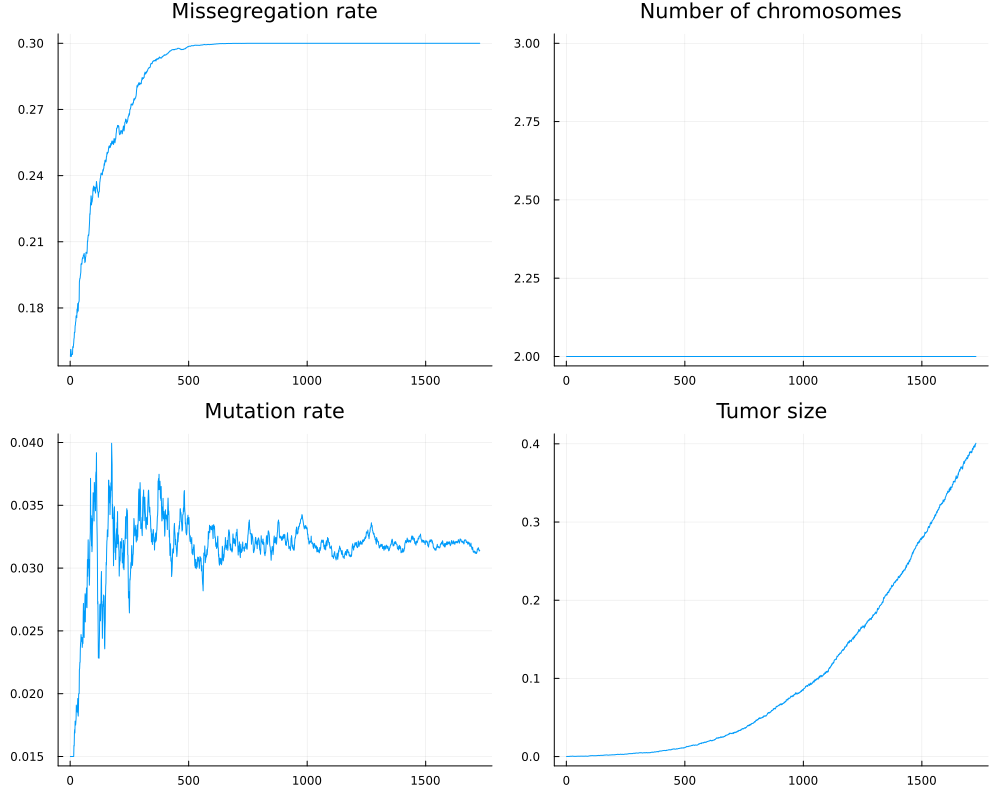

Done


In [15]:
#### Simulation ####
####################

tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.005, pert_chrom_gene_mut)
res_0 = simulation(tiss,length(chrom_gene_mut), 2500,100, false, true, 0.4)
plot_quantities(res_0)

println("Done")

In [32]:
### Save to file ###
#save_to_file(res_0.mu, "../Data/CancerEvo/single/0ch_m.txt", false)
#save_to_file(res_0.r, "../Data/CancerEvo/single/0ch_r.txt", false)
#save_to_file(res_0.activations[1], "../Data/CancerEvo/single/0ch_ia.txt", false)
#save_to_file(res_0.tumor_density, "../Data/CancerEvo/single/0ch_t.txt", false)
#save_to_file(res_0.muts[5], "../Data/CancerEvo/single/0ch_k.txt", false)

### Plots progression

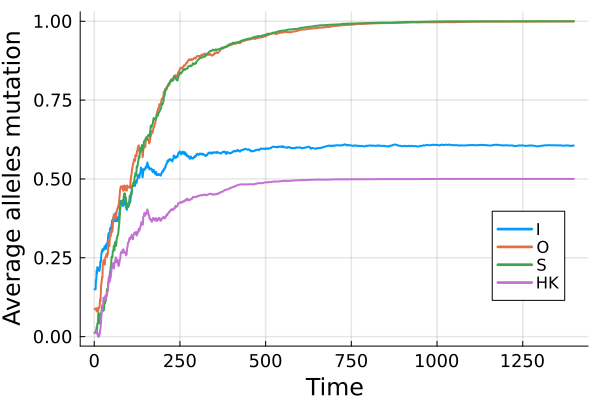

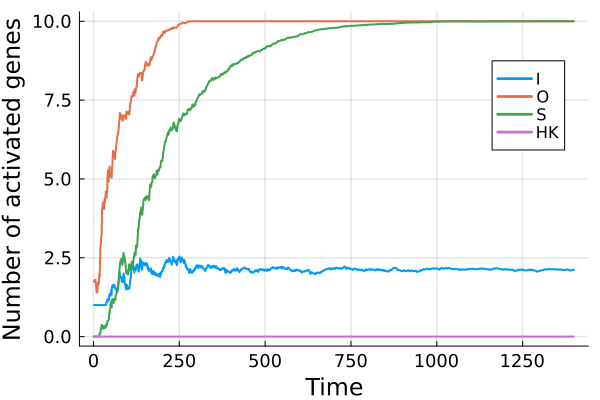

In [253]:
p_avg = plot(res_0.muts[[1,2,3,5]], label=hcat("I","O","S","HK"), lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12), yguidefontsize=16, ylabel="Average alleles mutation",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.9,0.35), grid=(1.5))
display(p_avg)
#savefig("images/0ch_m.png")
p_act = plot(res_0.activations[[1,2,3,5]], label=hcat("I","O","S","HK"), lw=2, 
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12), yguidefontsize=16, ylabel="Number of activated genes",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.9,0.8), grid=(1.5))
display(p_act)
#savefig("images/0ch_a.png")

In [29]:
plot(res_0.tumor_density, label="", lw=2, color="black",
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12), yguidefontsize=16, ylabel="Tumor density",#ylabel="Average number act. genes",
     legend=(0.5,0.95))
savefig("images/fig4_0ch_tum.png")
#plot!(twinx(),res.n_chrs, lw=1, color="red", label="Average # total alleles", ytickfont = font(12), ylabel="Number of alleles", yguidefontsize=16, legend=(0.5,0.88))

"/home/ubuntu/CancerEvo/images/fig4_0ch_tum.png"

### Interventions

#### a) killing cells porportional reproduction rate

In [244]:
#### Before intervention
tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.05, pert_chrom_gene_mut)
res = simulation(tiss,length(chrom_gene_mut), 2000,100, false, true, 0.3)

#### Intervention: remove cells, change mutation rate ####
int_a!(tiss, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)

#### After intervention ####
res_int = simulation(tiss,length(chrom_gene_mut), 1000,10000, false, true, 0.4)

println("Done")

Progress:  31%|████████████▊                            |  ETA: 0:00:26

Tumor size limit reached at iteration 627

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Progress:  12%|█████                                    |  ETA: 0:00:52

Tumor size limit reached at iteration 125

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07



Done


In [ ]:
#### Intervention plots, Fig 5 ####
###################################

pint = plot(vcat(res.tumor_density, res_int.tumor_density), label="Tumor density", color="blue", lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:blue), yguidefont=font(16,:blue), ylabel="Tumor cell density",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.11,0.95))
plot!(twinx(), vcat(res.mu, res_int.mu), color="red", label=L"\mu", lw=2,
      ytickfont = font(12,:red), yguidefont=font(16,:red), ylabel=L"\mu",# ylim=(0.0148, 0.048),
      legendfontsize=12, legend=(0.11,0.78))
vline!([length(res.tumor_density)], color="black", linestyle=:dash, lw=2, label="Intervention instant")
display(pint)
savefig("images/0ch_int_a.png")

#### b) killing low mutation rate

In [244]:
#### Before intervention
tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.05, pert_chrom_gene_mut)
res = simulation(tiss,length(chrom_gene_mut), 2000,100, false, true, 0.3)

#### Intervention: remove cells, change mutation rate ####
int_b!(tiss, 1, 1, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)

#### After intervention ####
res_int = simulation(tiss,length(chrom_gene_mut), 1000,10000, false, true, 0.4)

println("Done")

Progress:  31%|████████████▊                            |  ETA: 0:00:26

Tumor size limit reached at iteration 627

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Progress:  12%|█████                                    |  ETA: 0:00:52

Tumor size limit reached at iteration 125

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07



Done


In [ ]:
#### Intervention plots, Fig 5 ####
###################################

pint = plot(vcat(res.tumor_density, res_int.tumor_density), label="Tumor density", color="blue", lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:blue), yguidefont=font(16,:blue), ylabel="Tumor cell density",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.11,0.95))
plot!(twinx(), vcat(res.mu, res_int.mu), color="red", label=L"\mu", lw=2,
      ytickfont = font(12,:red), yguidefont=font(16,:red), ylabel=L"\mu", ylim=(0.0148, 0.048),
      legendfontsize=12, legend=(0.11,0.78))
vline!([length(res.tumor_density)], color="black", linestyle=:dash, lw=2, label="Intervention instant")
display(pint)
savefig("images/0ch_int_b_100.png")

#### c) killing high mutation rate

In [244]:
#### Before intervention
tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.05, pert_chrom_gene_mut)
res = simulation(tiss,length(chrom_gene_mut), 2000,100, false, true, 0.3)

#### Intervention: remove cells, change mutation rate ####
int_c!(tiss, 3, 1, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)

#### After intervention ####
res_int = simulation(tiss,length(chrom_gene_mut), 1000,10000, false, true, 0.4)

println("Done")

Progress:  31%|████████████▊                            |  ETA: 0:00:26

Tumor size limit reached at iteration 627

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Progress:  12%|█████                                    |  ETA: 0:00:52

Tumor size limit reached at iteration 125

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07



Done


In [ ]:
#### Intervention plots, Fig 5 ####
###################################

pint = plot(vcat(res.tumor_density, res_int.tumor_density), label="Tumor density", color="blue", lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:blue), yguidefont=font(16,:blue), ylabel="Tumor cell density",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.11,0.95))
plot!(twinx(), vcat(res.mu, res_int.mu), color="red", label=L"\mu", lw=2,
      ytickfont = font(12,:red), yguidefont=font(16,:red), ylabel=L"\mu", ylim=(0.0148, 0.05),
      legendfontsize=12, legend=(0.11,0.78))
vline!([length(res.tumor_density)], color="black", linestyle=:dash, lw=2, label="Intervention instant")
display(pint)
savefig("images/0ch_int_c_3.png")

#### d) increasing mutation rate

In [244]:
#### Before intervention
tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.05, pert_chrom_gene_mut)
res = simulation(tiss,length(chrom_gene_mut), 2000,100, false, true, 0.3)

#### Intervention: remove cells, change mutation rate ####
int_d!(tiss, 25e-3, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)

#### After intervention ####
res_int = simulation(tiss,length(chrom_gene_mut), 1000,10000, false, true, 0.4)

println("Done")

Progress:  31%|████████████▊                            |  ETA: 0:00:26

Tumor size limit reached at iteration 627

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Progress:  12%|█████                                    |  ETA: 0:00:52

Tumor size limit reached at iteration 125

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07



Done


In [ ]:
#### Intervention plots, Fig 5 ####
###################################

pint = plot(vcat(res.tumor_density, res_int.tumor_density), label="Tumor density", color="blue", lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:blue), yguidefont=font(16,:blue), ylabel="Tumor cell density",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.11,0.95))
plot!(twinx(), vcat(res.mu, res_int.mu), color="red", label=L"\mu", lw=2,
      ytickfont = font(12,:red), yguidefont=font(16,:red), ylabel=L"\mu", #ylim=(0.0148, 0.048),
      legendfontsize=12, legend=(0.11,0.78))
vline!([length(res.tumor_density)], color="black", linestyle=:dash, lw=2, label="Intervention instant")
display(pint)
savefig("images/0ch_int_d_15_25.png")

### Heatmaps

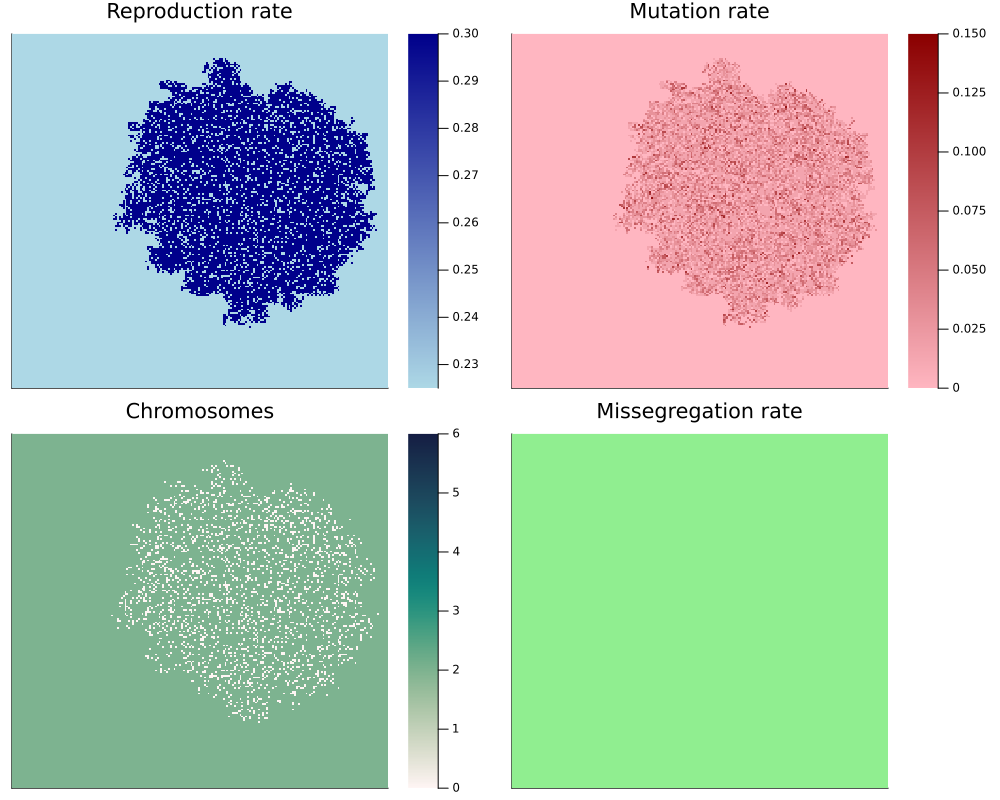

GKS: Rectangle definition is invalid in routine SET_WINDOW
GKS: Rectangle definition is invalid in routine CELLARRAY
invalid range
origin outside current window
GKS: Rectangle definition is invalid in routine SET_WINDOW
GKS: Rectangle definition is invalid in routine CELLARRAY
invalid range
origin outside current window
GKS: Rectangle definition is invalid in routine SET_WINDOW
GKS: Rectangle definition is invalid in routine CELLARRAY
invalid range
origin outside current window


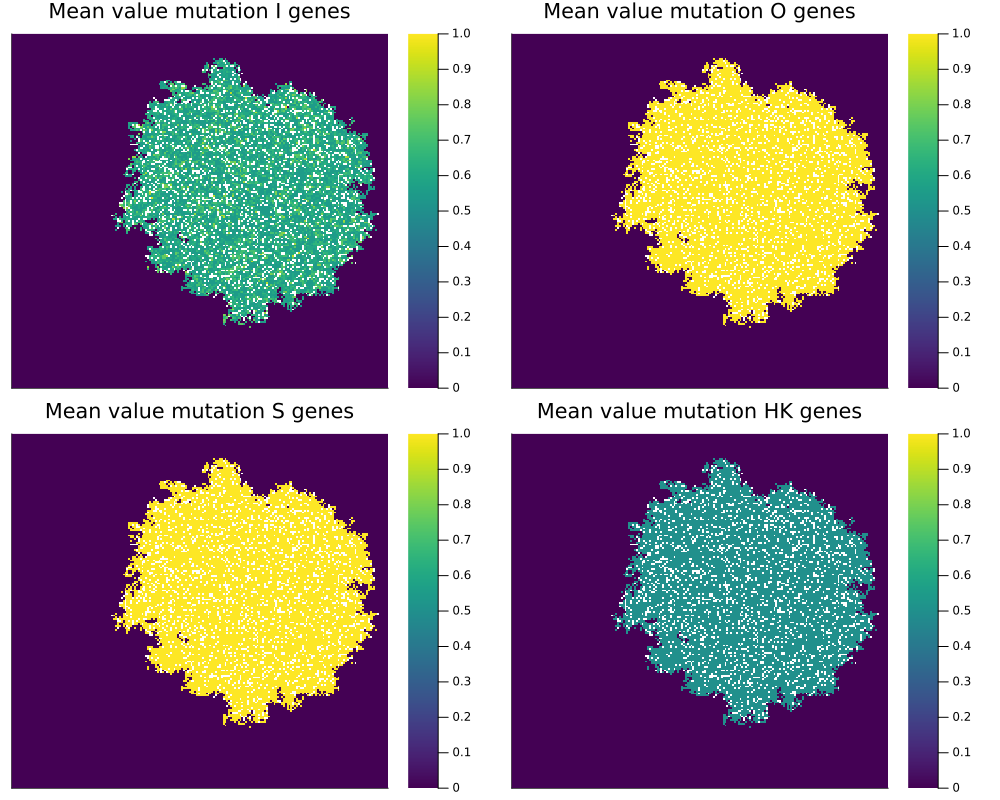

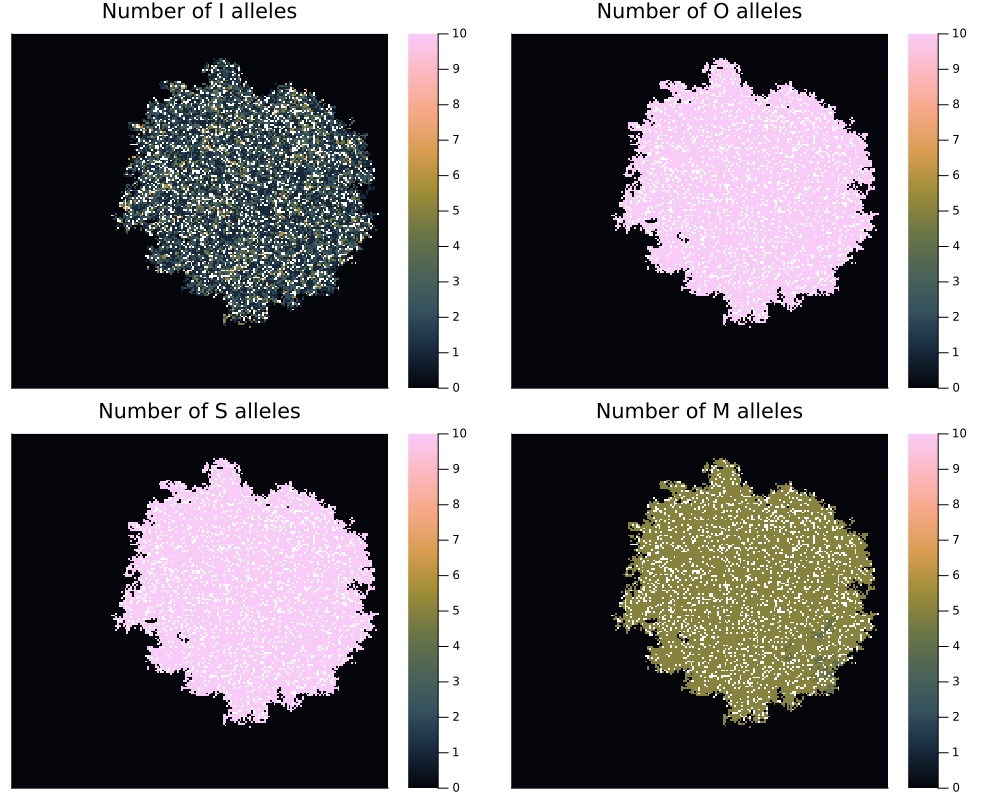

In [17]:
##### HEATMAPS ######
#####################

tisplot = res_0.tissues[15]
plot_quant(tisplot)
plot_gen(tisplot)
plot_activations(tisplot)
#heatmap(get_nomutgenes(tiss,["HK"]))
#plot_quant(tiss)
#plot_gen(tiss)
#plot_activations(tiss)
#savefig("hh.png")

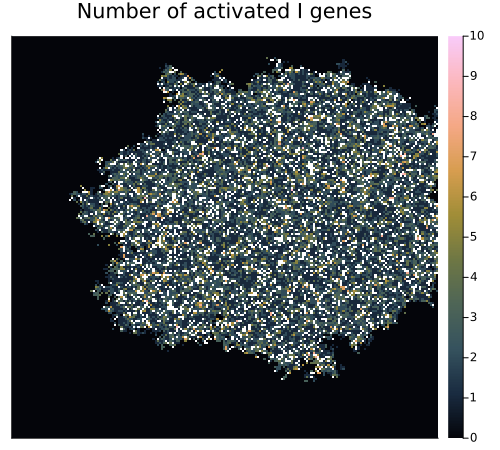

In [30]:
gtype_p5 = "I"
heatmap(get_activation_pergene(last(res_0.tissues), gtype_p5,"all"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of activated " * join(gtype_p5, "-") * " genes",
             xticks = false,
             yticks = false, size=(500,450))
#savefig("images/fig4_0ch_heat.png")

In [ ]:
#### Nice heatmpas for paper ####


tis = copy_tissue(res.tissues[7])
tis.cells = tis.cells[50:150,50:150]
tis.L = 101

p1 = heatmap(get_r(tis),#get_Nchrs(tiss).*get_state(tiss),
             color = :tempo,
             clims = (tiss.cells[1,1].r0*1.5, tiss.cells[1,1].rmax),
             title = "Chromosomes",
             xticks = false,
             yticks = false)

p2 = heatmap(get_mu(tis),
             color = :reds,
             clims = (mu0, mu0+N_I*dmu), # adjust as needed
             title = "Mutation rate",
             xticks = false,
             yticks = false)

p3 = heatmap(get_m(tis),
             color = :blues,
             #clims = (0, N_M*dm), # adjust as needed
             title = "Mutation rate",
             xticks = false,
             yticks = false)

p4 = heatmap(get_Nchrs(tis),
             color = :greens,
             clims = (0, N_M*dm), # adjust as needed
             title = "Mutation rate",
             xticks = false,
             yticks = false)

gtype_p5 = "I"
pi5 = heatmap(get_activation_pergene(tis, gtype_p5,"any"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p5, "-") * " alleles",
             xticks = false,
             yticks = false)
gtype_p6 = "O"
pi6 = heatmap(get_activation_pergene(tis, gtype_p6,"any"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p6, "-") * " alleles",
             xticks = false,
             yticks = false)
gtype_p7 = "S"
pi7 = heatmap(get_activation_pergene(tis, gtype_p7,"all"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p7, "-") * " alleles",
             xticks = false,
             yticks = false)
gtype_p8 = "M"
pi8 = heatmap(get_activation_pergene(tis, gtype_p8,"all"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p8, "-") * " alleles",
             xticks = false,
             yticks = false)

gtype_p9 = "HK"
pi9 = heatmap(get_activation_pergene(tis, gtype_p9,"all"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p8, "-") * " alleles",
             xticks = false,
             yticks = false)

p_res = plot(p1, p2, p3,p4,pi5, pi6, pi7, pi8,pi9, layout = (3, 3), size = (1000, 1000))

### Chromosome distribution

In [ ]:
function normalize(vec)
    vecc = copy(vec)
    vecc = vecc.-mean(vecc)
    vecc = vecc/std(vecc)
    return vecc
end

In [ ]:
plot(normalize(res.n_chrs))

In [ ]:
plot(normalize(invert(res.I_populations_density[1000:2000])[1]), label="pop1")
#plot!(normalize(invert(res.I_populations_density[1000:2000])[10]), label="pop10")
#plot!(normalize(res.muts[5][1000:2000]), label="hk lim")
plot!(normalize(res.n_chrs[1000:2000]), label="chrs")

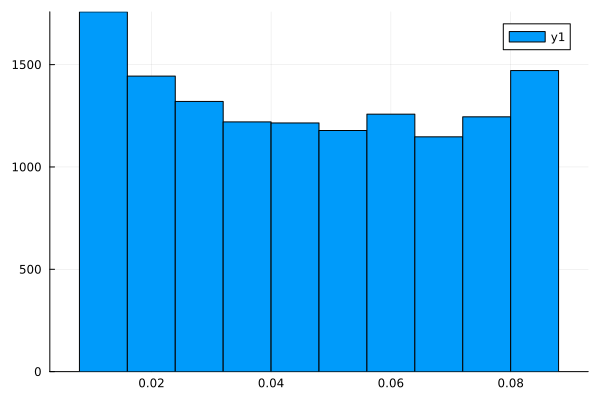

In [94]:
histogram(get_mu(tiss)[findall(x->x==1, get_state(tiss))], bins=0.008:0.008:0.088)

In [ ]:
length([findall(x->x==0, get_nomutgenes(tiss, ["I"]))][1])

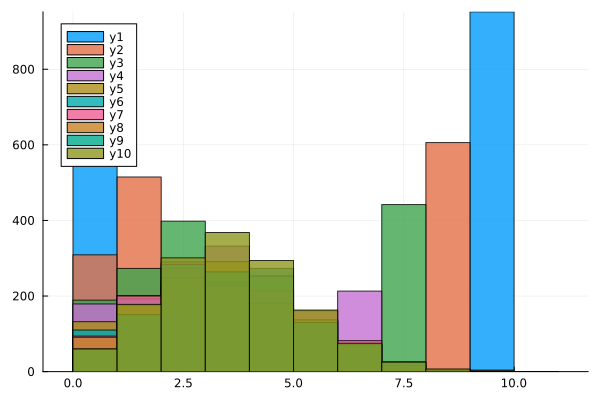

In [93]:
h = histogram()
for i in 1:10
    histogram!(get_nomutgenes(tiss, ["I"])[findall(x->x==i*dmu, get_mu(tiss))], bins=0:1:11, alpha=0.8)
end
display(h)

In [ ]:
histogram(get_mu(tiss)[findall(x->x==6, get_nomutgenes(tiss,["HK"]))], bins=0.008:0.008:0.088)

In [97]:
nmg = get_nomutgenes(tiss, ["HK"])[findall(x->x==1, get_state(tiss))]
nmu = get_mu(tiss)[findall(x->x==1, get_state(tiss))]

13256-element Vector{Float64}:
 0.064
 0.032
 0.032
 0.08
 0.032
 0.08
 0.048
 0.016
 0.048
 0.08
 0.08
 0.064
 0.048
 ⋮
 0.016
 0.024
 0.048
 0.048
 0.024
 0.08
 0.016
 0.04
 0.08
 0.08
 0.08
 0.064

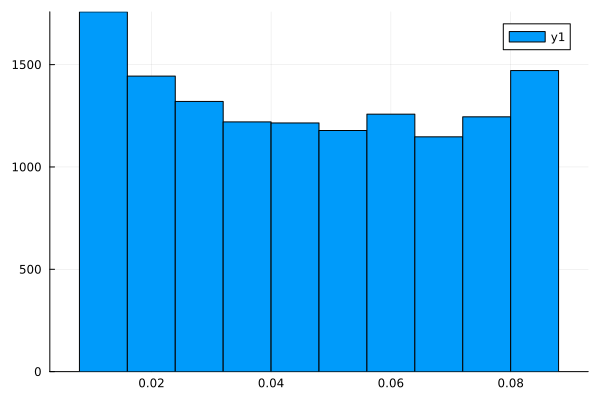

In [98]:
histogram(nmu,bins=0.008:0.008:0.088)

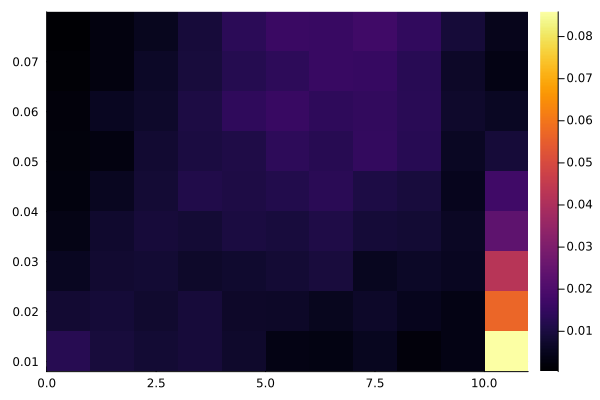

In [104]:
histogram2d(nmg,nmu, bins=(10,0.008:0.008:0.08), normalize=:probability)

## 1ch => Whole chromosomes missegregation

In [18]:
#### Parameters ####
###############################

#### Chromosome parameters #####
N_CHR = 2
N_I  = 10
N_O  = 10
N_S  = 10
N_M  = 5
N_HK = 10
N0_genes  = N_I+N_O+N_S+N_M+N_HK
gene_map = create_gene_map(N_I, N_O, N_S, N_M, N_HK)

#### Wild Type Chromosome ####
chrom_gene_type = fill(collect(1:N0_genes), N_CHR)
chrom_gene_mut = fill(fill(0,N0_genes), N_CHR)

#### Perturbed Chromosome ####
pert_chrom_gene_mut = Vector{Vector{Int}}()
for i in 1:N_CHR
    push!(pert_chrom_gene_mut, copy(fill(0, N0_genes)))
end

pert_chrom_gene_mut[1][1] = 1      # I genes perturbation
pert_chrom_gene_mut[2][1] = 1      # I genes perturbation
pert_chrom_gene_mut[1][1+N_I] = 1  # O genes perturbation

#### Tissue parameters ####
L       = 200
mu0     = 0.
dmu     = 15e-3
r0      = 1.5e-1
dr      = 0.8e-2
dm      = 1e-2

println("Parameters defined")

Parameters defined


Progress:  73%|█████████████████████████████▉           |  ETA: 0:02:41

Tumor size limit reached at iteration 1824

Progress: 100%|█████████████████████████████████████████| Time: 0:07:15


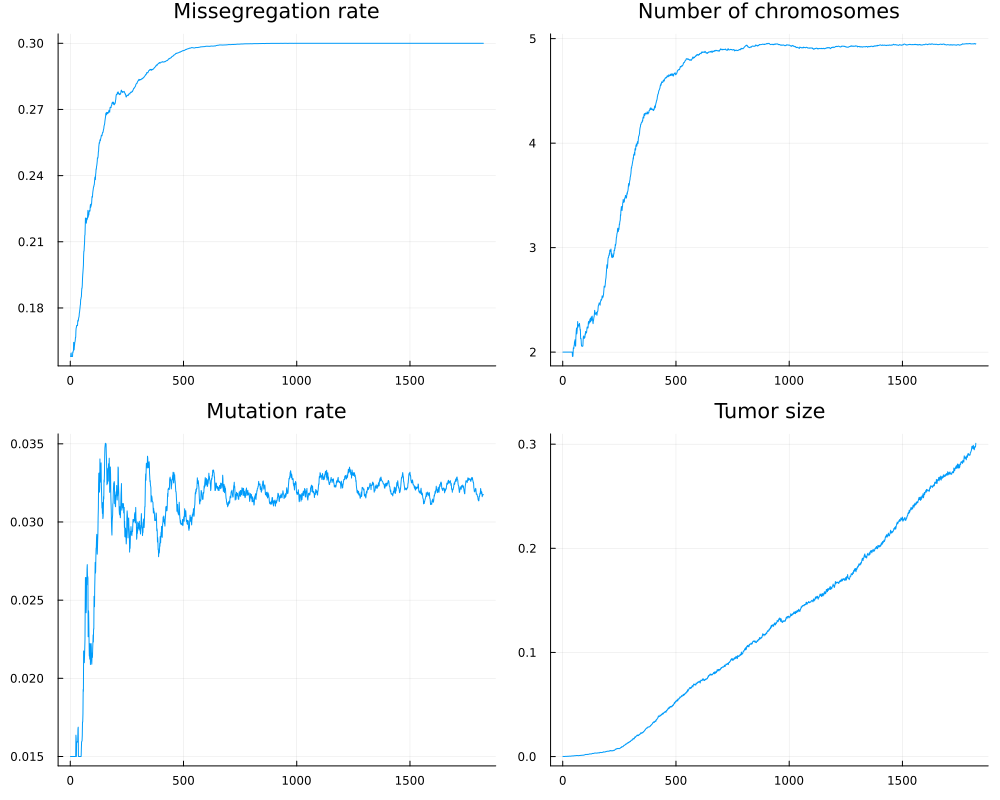

Done


In [19]:
#### Simulation ####
####################

tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.005, pert_chrom_gene_mut)
res_1 = simulation(tiss,length(chrom_gene_mut), 2500,100, false, true, 0.3)
plot_quantities(res_1)

println("Done")

In [34]:
### Save to file ###
#save_to_file(res_1.mu, "../Data/CancerEvo/single/1ch_m.txt", false)
#save_to_file(res_1.r, "../Data/CancerEvo/single/1ch_r.txt", false)
#save_to_file(res_1.activations[5], "../Data/CancerEvo/single/1ch_ia.txt", false)
#save_to_file(res_1.tumor_density, "../Data/CancerEvo/single/1ch_t.txt", false)
#save_to_file(res_1.n_chrs, "../Data/CancerEvo/single/1ch_ng.txt", false)

### Plots progression

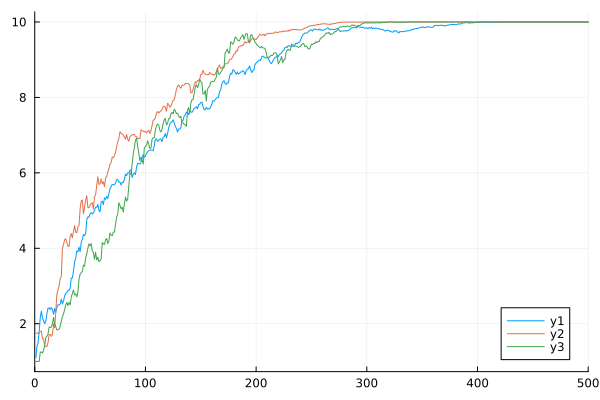

In [267]:
plot(aO_2ch[2], xlim=(0,500))
plot!(res_0.activations[2])
plot!(res_1.activations[2])

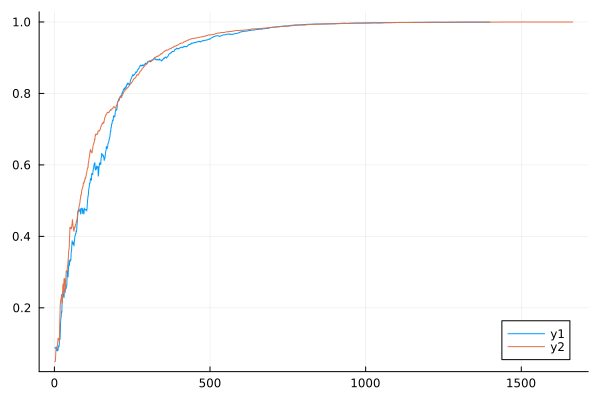

In [289]:
#plot(aO_2ch[2], xlim=(0,500))
plot(res_0.muts[2])
plot!(res_1.muts[2])

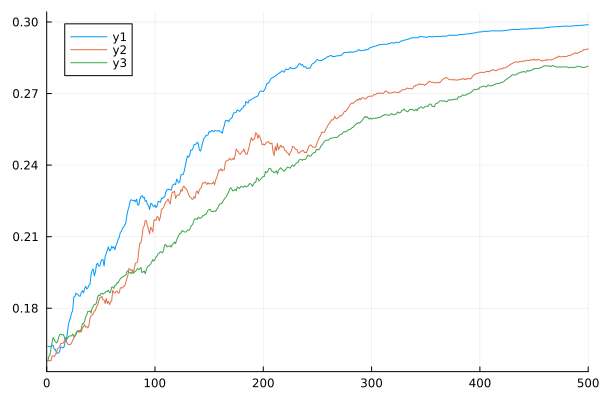

In [270]:

plot(res_0.r)
plot!(res_1.r)
plot!(r_2ch[2], xlim=(0,500))

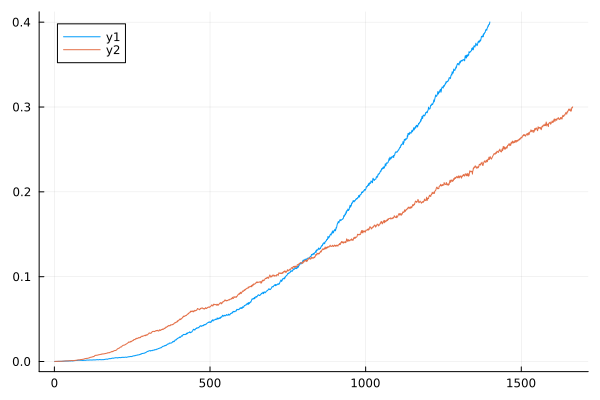

In [290]:
plot(res_0.tumor_density)
plot!(res_1.tumor_density)

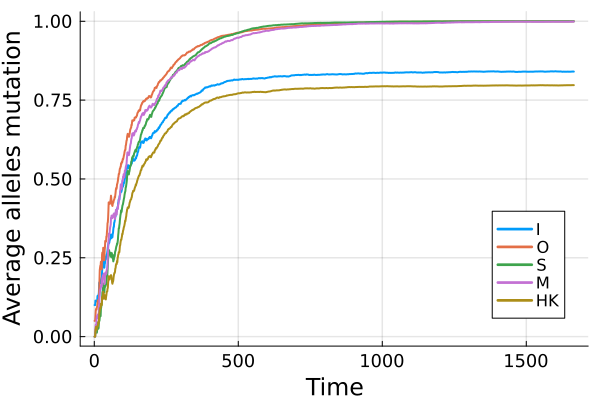

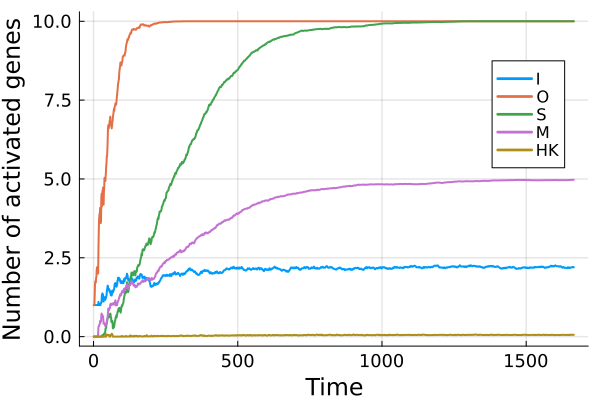

"/home/ubuntu/CancerEvo/images/1ch_a.png"

In [293]:
p_avg = plot(res_1.muts, label=hcat("I","O","S","M","HK"), lw=2, 
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12), yguidefontsize=16, ylabel="Average alleles mutation",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.9,0.35), grid=(1.5))#, xlim=(-50,2100))
display(p_avg)
#savefig("images/1ch_m.png")
p_act = plot(res_1.activations, label=hcat("I","O","S","M","HK"), lw=2, 
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12), yguidefontsize=16, ylabel="Number of activated genes",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.9,0.8), grid=(1.5))#, xlim=(-50,2100))
display(p_act)
#savefig("images/1ch_a.png")

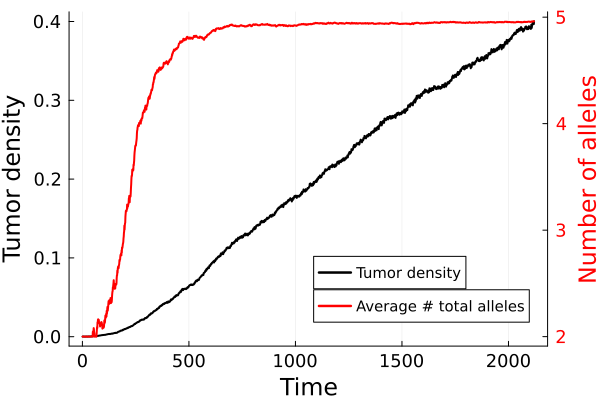

"/home/ubuntu/CancerEvo/images/fig4_1ch_tum.png"

In [21]:
p_progr = plot(res_1.tumor_density, label="Tumor density", lw=2, color="black",
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:black), yguidefont=font(16,:black), ylabel="Tumor density",#ylabel="Average number act. genes",
     legend=(0.6,0.22), legendfont=font(10))
plot!(twinx(),res_1.n_chrs, lw=2, color="red", label="Average # total alleles", 
      ytickfont = font(12,:red), ylabel="Number of alleles", yguidefont=font(16,:red), 
      legend=(0.6,0.12), legendfont=font(10))
display(p_progr)
savefig("images/fig4_1ch_tum.png")

### Interventions

#### a) killing cells porportional reproduction rate

In [244]:
#### Before intervention
tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.05, pert_chrom_gene_mut)
res = simulation(tiss,length(chrom_gene_mut), 2000,100, false, true, 0.3)

#### Intervention: remove cells, change mutation rate ####
int_a!(tiss, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)

#### After intervention ####
res_int = simulation(tiss,length(chrom_gene_mut), 1000,10000, false, true, 0.4)

println("Done")

Progress:  31%|████████████▊                            |  ETA: 0:00:26

Tumor size limit reached at iteration 627

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Progress:  12%|█████                                    |  ETA: 0:00:52

Tumor size limit reached at iteration 125

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07



Done


In [ ]:
#### Intervention plots, Fig 5 ####
###################################

pint = plot(vcat(res.tumor_density, res_int.tumor_density), label="Tumor density", color="blue", lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:blue), yguidefont=font(16,:blue), ylabel="Tumor cell density",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.11,0.95))
plot!(twinx(), vcat(res.mu, res_int.mu), color="red", label=L"\mu", lw=2,
      ytickfont = font(12,:red), yguidefont=font(16,:red), ylabel=L"\mu",# ylim=(0.0148, 0.048),
      legendfontsize=12, legend=(0.11,0.78))
vline!([length(res.tumor_density)], color="black", linestyle=:dash, lw=2, label="Intervention instant")
display(pint)
savefig("images/1ch_int_a.png")

#### b) killing low mutation rate

In [244]:
#### Before intervention
tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.05, pert_chrom_gene_mut)
res = simulation(tiss,length(chrom_gene_mut), 2000,100, false, true, 0.3)

#### Intervention: remove cells, change mutation rate ####
int_b!(tiss, 1, 1, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)

#### After intervention ####
res_int = simulation(tiss,length(chrom_gene_mut), 1000,10000, false, true, 0.4)

println("Done")

Progress:  31%|████████████▊                            |  ETA: 0:00:26

Tumor size limit reached at iteration 627

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Progress:  12%|█████                                    |  ETA: 0:00:52

Tumor size limit reached at iteration 125

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07



Done


In [ ]:
#### Intervention plots, Fig 5 ####
###################################

pint = plot(vcat(res.tumor_density, res_int.tumor_density), label="Tumor density", color="blue", lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:blue), yguidefont=font(16,:blue), ylabel="Tumor cell density",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.11,0.95))
plot!(twinx(), vcat(res.mu, res_int.mu), color="red", label=L"\mu", lw=2,
      ytickfont = font(12,:red), yguidefont=font(16,:red), ylabel=L"\mu", ylim=(0.0148, 0.048),
      legendfontsize=12, legend=(0.11,0.78))
vline!([length(res.tumor_density)], color="black", linestyle=:dash, lw=2, label="Intervention instant")
display(pint)
savefig("images/1ch_int_b_100.png")

#### c) killing high mutation rate

In [244]:
#### Before intervention
tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.05, pert_chrom_gene_mut)
res = simulation(tiss,length(chrom_gene_mut), 2000,100, false, true, 0.3)

#### Intervention: remove cells, change mutation rate ####
int_c!(tiss, 3, 1, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)

#### After intervention ####
res_int = simulation(tiss,length(chrom_gene_mut), 1000,10000, false, true, 0.4)

println("Done")

Progress:  31%|████████████▊                            |  ETA: 0:00:26

Tumor size limit reached at iteration 627

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Progress:  12%|█████                                    |  ETA: 0:00:52

Tumor size limit reached at iteration 125

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07



Done


In [ ]:
#### Intervention plots, Fig 5 ####
###################################

pint = plot(vcat(res.tumor_density, res_int.tumor_density), label="Tumor density", color="blue", lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:blue), yguidefont=font(16,:blue), ylabel="Tumor cell density",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.11,0.95))
plot!(twinx(), vcat(res.mu, res_int.mu), color="red", label=L"\mu", lw=2,
      ytickfont = font(12,:red), yguidefont=font(16,:red), ylabel=L"\mu", ylim=(0.0148, 0.05),
      legendfontsize=12, legend=(0.11,0.78))
vline!([length(res.tumor_density)], color="black", linestyle=:dash, lw=2, label="Intervention instant")
display(pint)
savefig("images/1ch_int_c_3.png")

#### d) increasing mutation rate

In [244]:
#### Before intervention
tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
perturb_init_tissue!(tiss, 0.05, pert_chrom_gene_mut)
res = simulation(tiss,length(chrom_gene_mut), 2000,100, false, true, 0.3)

#### Intervention: remove cells, change mutation rate ####
int_d!(tiss, 25e-3, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, dm)

#### After intervention ####
res_int = simulation(tiss,length(chrom_gene_mut), 1000,10000, false, true, 0.4)

println("Done")

Progress:  31%|████████████▊                            |  ETA: 0:00:26

Tumor size limit reached at iteration 627

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Progress:  12%|█████                                    |  ETA: 0:00:52

Tumor size limit reached at iteration 125

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07



Done


In [ ]:
#### Intervention plots, Fig 5 ####
###################################

pint = plot(vcat(res.tumor_density, res_int.tumor_density), label="Tumor density", color="blue", lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12,:blue), yguidefont=font(16,:blue), ylabel="Tumor cell density",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.11,0.95))
plot!(twinx(), vcat(res.mu, res_int.mu), color="red", label=L"\mu", lw=2,
      ytickfont = font(12,:red), yguidefont=font(16,:red), ylabel=L"\mu", #ylim=(0.0148, 0.048),
      legendfontsize=12, legend=(0.11,0.78))
vline!([length(res.tumor_density)], color="black", linestyle=:dash, lw=2, label="Intervention instant")
display(pint)
savefig("images/1ch_int_d_15_25.png")

### Heatmaps

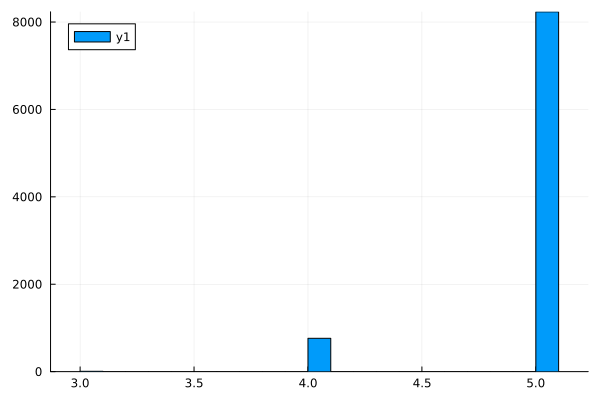

In [56]:
histogram(get_Nchrs(last(res_1.tissues))[findall(x->x==1, get_state(tiss))])

In [62]:
tiss.cells[1,10]

Cell(3, 142, Chromosomes([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], Dict(5 => "I", 16 => "O", 20 => "O", 35 => "M", 30 => "S", 19 => "O", 32 => "M", 6 => "I", 45 => "HK", 44 => "HK"…)), 0, 0.0, 0.015, 0.0, 0.15, 0.008, 0.3, 0.15, 0.005, 0.0)

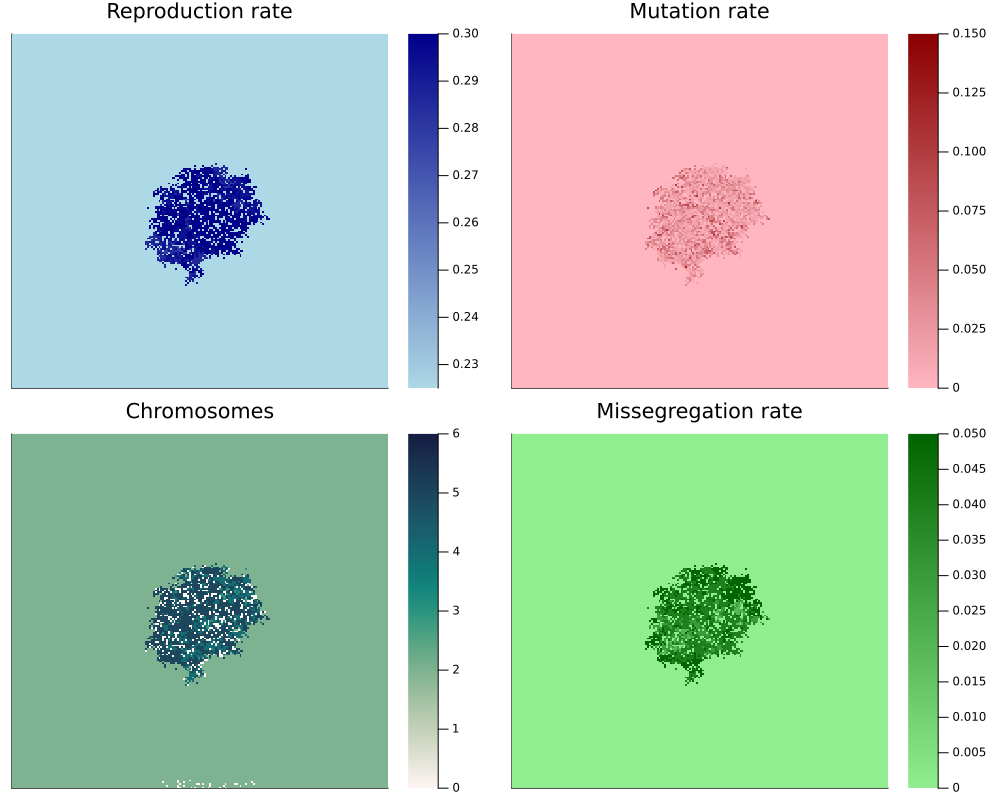

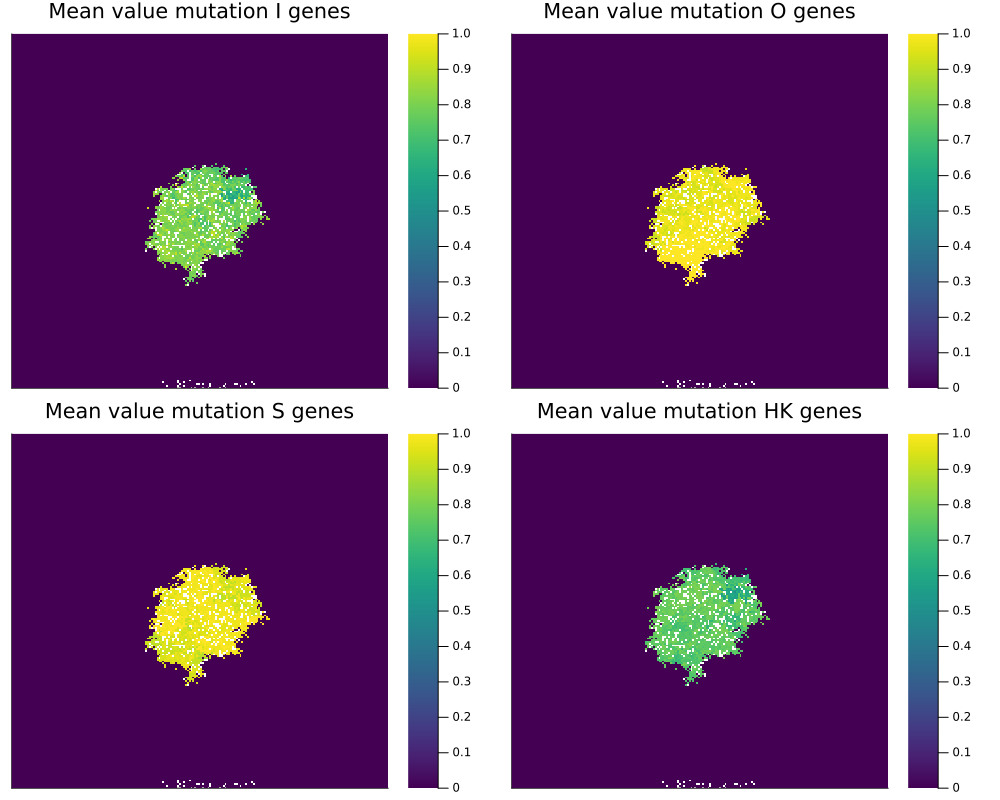

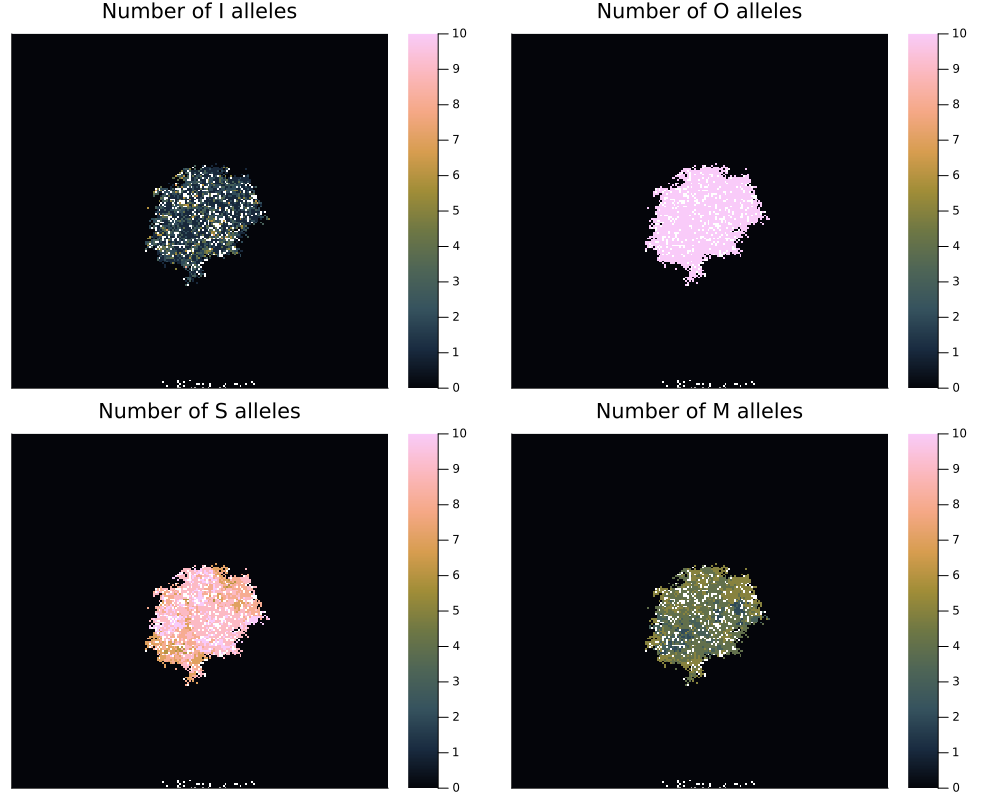

In [39]:
##### HEATMAPS ######
#####################

tisplot = res_1.tissues[5]
plot_quant(tisplot)
plot_gen(tisplot)
plot_activations(tisplot)
#heatmap(get_nomutgenes(tiss,["HK"]))
#plot_quant(tiss)
#plot_gen(tiss)
#plot_activations(tiss)
#savefig("hh.png")

In [28]:
get_activation_pergene(last(res_1.tissues))

LoadError: MethodError: no method matching get_activation_pergene(::Tissue)
The function `get_activation_pergene` exists, but no method is defined for this combination of argument types.

[0mClosest candidates are:
[0m  get_activation_pergene(::Tissue, [91m::String[39m, [91m::String[39m)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[7]:175[24m[39m


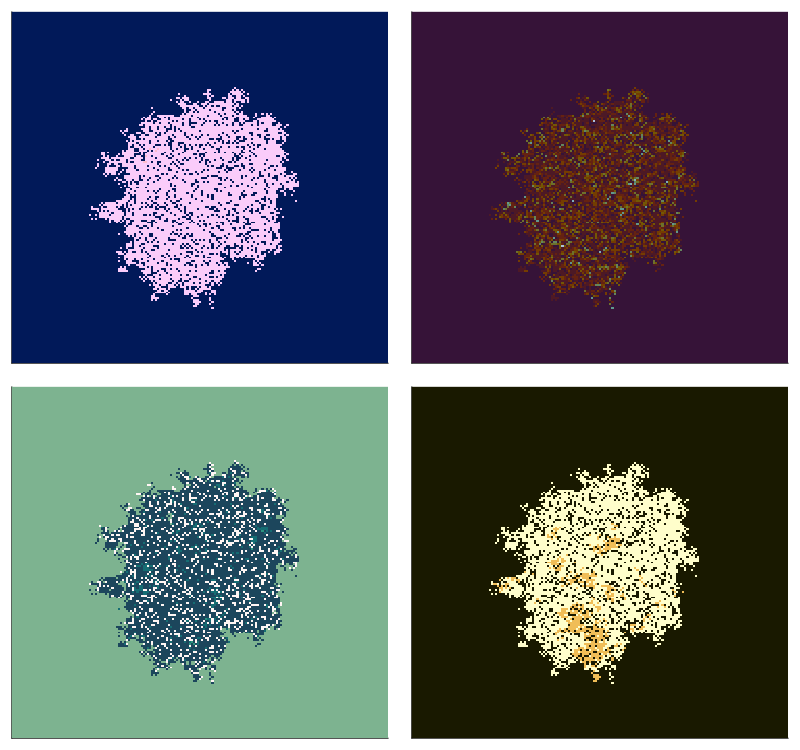

In [95]:
tiss = res_1.tissues[10]

p1 = heatmap(get_r(tiss)[10:190,20:200],#get_Nchrs(tiss).*get_state(tiss),
                 color = :batlow,
    cbar=false,
                 clims = (tiss.cells[1,1].r0*1.5, tiss.cells[1,1].rmax),
                 #title = "Reproduction rate",
                 xticks = false,
                 yticks = false)
    
p2 = heatmap(get_mu(tiss)[10:190,20:200],
             color = :glasgow,
    cbar=false,
             clims = (tiss.cells[1,1].mu0, tiss.cells[1,1].mu0+N_I*tiss.cells[1,1].dmu), # adjust as needed
             #title = "Mutation rate",
             xticks = false,
             yticks = false)

 p3 = heatmap(get_Nchrs(tiss)[10:190,20:200],#get_Nchrs(tiss).*get_state(tiss),
             color = :tempo,
    cbar=false,
             clims = (0, 6),
             #title = "Chromosomes",
             xticks = false,
             yticks = false)

p4 = heatmap(get_m(tiss)[10:190,20:200],
             color = :lajolla,
    cbar=false,
             clims = (0, tiss.cells[1,1].m+N_M*tiss.cells[1,1].dm), # adjust as needed
             #title = "Missegregation rate",
             xticks = false,
             yticks = false)

p_res = plot(p1, p2, p3, p4, layout = (2, 2), size = (800, 750))
savefig("images/t10.png")
display(p_res)


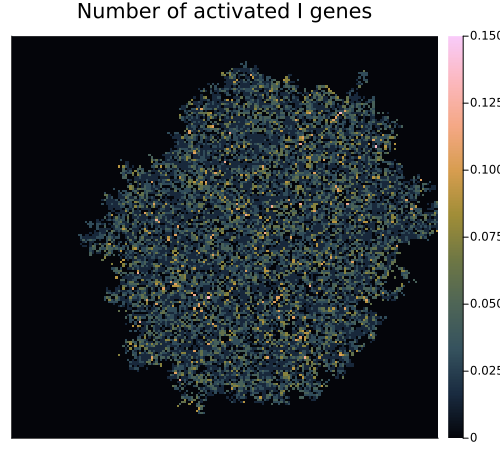

In [45]:
gtype_p5 = "I"
heatmap(get_mu(last(res_1.tissues))[10:190,20:200],
             color = :batlowK10,
             clims = (0,tiss.cells[1,1].dmu*10),
             title = "Number of activated " * join(gtype_p5, "-") * " genes",
             xticks = false,
             yticks = false, size=(500,450))
#savefig("images/fig4_1ch_heat.png")

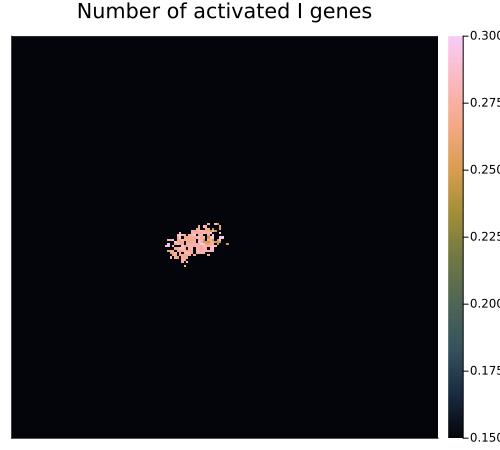

In [51]:
gtype_p5 = "I"
heatmap(get_r(res_1.tissues[2])[10:190,20:200],
             color = :batlowK10,
             clims = (r0,r0*2),
             title = "Number of activated " * join(gtype_p5, "-") * " genes",
             xticks = false,
             yticks = false, size=(500,450))
#savefig("images/fig4_1ch_heat.png")

In [ ]:
#### Nice heatmpas for paper ####


tis = copy_tissue(res.tissues[7])
tis.cells = tis.cells[50:150,50:150]
tis.L = 101

p1 = heatmap(get_r(tis),#get_Nchrs(tiss).*get_state(tiss),
             color = :tempo,
             clims = (tiss.cells[1,1].r0*1.5, tiss.cells[1,1].rmax),
             title = "Chromosomes",
             xticks = false,
             yticks = false)

p2 = heatmap(get_mu(tis),
             color = :reds,
             clims = (mu0, mu0+N_I*dmu), # adjust as needed
             title = "Mutation rate",
             xticks = false,
             yticks = false)

p3 = heatmap(get_m(tis),
             color = :blues,
             #clims = (0, N_M*dm), # adjust as needed
             title = "Mutation rate",
             xticks = false,
             yticks = false)

p4 = heatmap(get_Nchrs(tis),
             color = :greens,
             clims = (0, N_M*dm), # adjust as needed
             title = "Mutation rate",
             xticks = false,
             yticks = false)

gtype_p5 = "I"
pi5 = heatmap(get_activation_pergene(tis, gtype_p5,"any"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p5, "-") * " alleles",
             xticks = false,
             yticks = false)
gtype_p6 = "O"
pi6 = heatmap(get_activation_pergene(tis, gtype_p6,"any"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p6, "-") * " alleles",
             xticks = false,
             yticks = false)
gtype_p7 = "S"
pi7 = heatmap(get_activation_pergene(tis, gtype_p7,"all"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p7, "-") * " alleles",
             xticks = false,
             yticks = false)
gtype_p8 = "M"
pi8 = heatmap(get_activation_pergene(tis, gtype_p8,"all"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p8, "-") * " alleles",
             xticks = false,
             yticks = false)

gtype_p9 = "HK"
pi9 = heatmap(get_activation_pergene(tis, gtype_p9,"all"),
             color = :batlowK10,
             clims = (0,10),
             title = "Number of " * join(gtype_p8, "-") * " alleles",
             xticks = false,
             yticks = false)

p_res = plot(p1, p2, p3,p4,pi5, pi6, pi7, pi8,pi9, layout = (3, 3), size = (1000, 1000))

### Chromosome distribution

In [ ]:
function normalize(vec)
    vecc = copy(vec)
    vecc = vecc.-mean(vecc)
    vecc = vecc/std(vecc)
    return vecc
end

In [ ]:
plot(normalize(res.n_chrs))

In [ ]:
plot(normalize(invert(res.I_populations_density[1000:2000])[1]), label="pop1")
#plot!(normalize(invert(res.I_populations_density[1000:2000])[10]), label="pop10")
#plot!(normalize(res.muts[5][1000:2000]), label="hk lim")
plot!(normalize(res.n_chrs[1000:2000]), label="chrs")

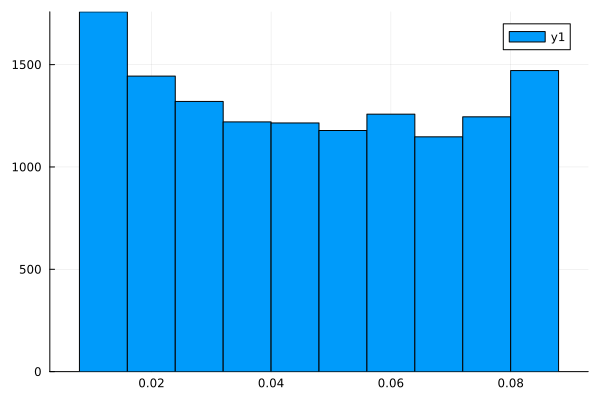

In [94]:
histogram(get_mu(tiss)[findall(x->x==1, get_state(tiss))], bins=0.008:0.008:0.088)

In [ ]:
length([findall(x->x==0, get_nomutgenes(tiss, ["I"]))][1])

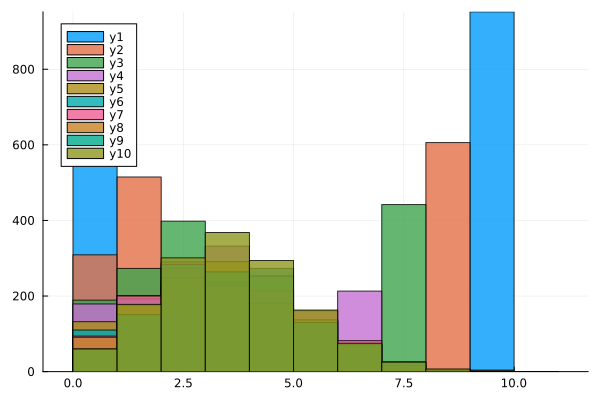

In [93]:
h = histogram()
for i in 1:10
    histogram!(get_nomutgenes(tiss, ["I"])[findall(x->x==i*dmu, get_mu(tiss))], bins=0:1:11, alpha=0.8)
end
display(h)

In [ ]:
histogram(get_mu(tiss)[findall(x->x==6, get_nomutgenes(tiss,["HK"]))], bins=0.008:0.008:0.088)

In [97]:
nmg = get_nomutgenes(tiss, ["HK"])[findall(x->x==1, get_state(tiss))]
nmu = get_mu(tiss)[findall(x->x==1, get_state(tiss))]

13256-element Vector{Float64}:
 0.064
 0.032
 0.032
 0.08
 0.032
 0.08
 0.048
 0.016
 0.048
 0.08
 0.08
 0.064
 0.048
 ⋮
 0.016
 0.024
 0.048
 0.048
 0.024
 0.08
 0.016
 0.04
 0.08
 0.08
 0.08
 0.064

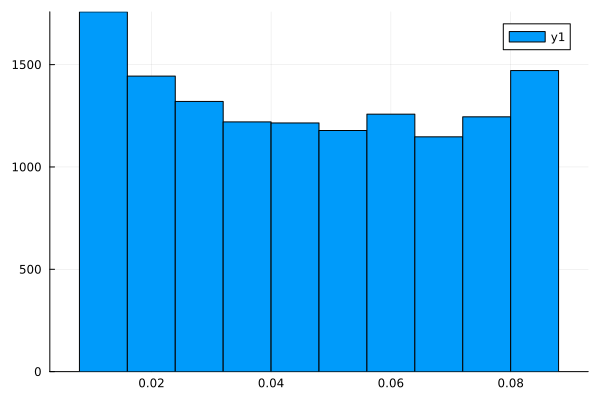

In [98]:
histogram(nmu,bins=0.008:0.008:0.088)

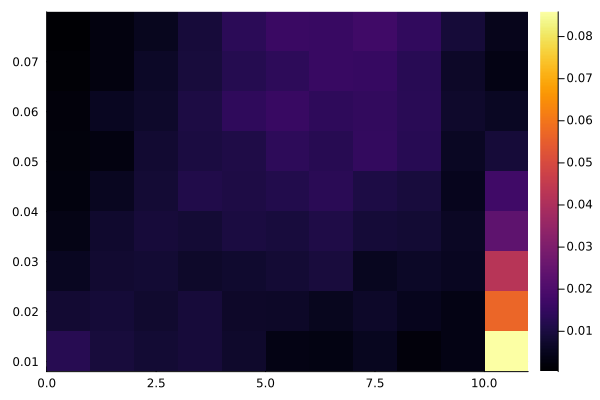

In [104]:
histogram2d(nmg,nmu, bins=(10,0.008:0.008:0.08), normalize=:probability)

# Multiple repetitions

## 0ch

In [17]:
#### Parameters ####
###############################

#### Chromosome parameters #####
N_CHR = 2
N_I  = 10
N_O  = 10
N_S  = 10
N_M  = 5
N_HK = 10
N0_genes  = N_I+N_O+N_S+N_M+N_HK
gene_map = create_gene_map(N_I, N_O, N_S, N_M, N_HK)

#### Wild Type Chromosome ####
chrom_gene_type = fill(collect(1:N0_genes), N_CHR)
chrom_gene_mut = fill(fill(0,N0_genes), N_CHR)

#### Perturbed Chromosome ####
pert_chrom_gene_mut = Vector{Vector{Int}}()
for i in 1:N_CHR
    push!(pert_chrom_gene_mut, copy(fill(0, N0_genes)))
end

pert_chrom_gene_mut[1][1] = 1      # I genes perturbation
pert_chrom_gene_mut[2][1] = 1      # I genes perturbation
pert_chrom_gene_mut[1][1+N_I] = 1  # O genes perturbation

#### Tissue parameters ####
L       = 200
mu0     = 0.
dmu     = 15e-3
r0      = 1.5e-1
dr      = 0.8e-2
dm      = 0.

println("Parameters defined")

Parameters defined


In [ ]:
# Multiple repetitions
# --------------------

clear_flag = true

if clear_flag
    write("../Data/CancerEvo/0ch_t.txt", "")
    write("../Data/CancerEvo/0ch_r.txt", "")
    write("../Data/CancerEvo/0ch_mu.txt", "")
    write("../Data/CancerEvo/0ch_state.txt", "")
    write("../Data/CancerEvo/0ch_k.txt", "")
end

dm    = 0.
nreps = 500

for nr in 1:nreps
    println("Iteration ", nr)

    tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
    perturb_init_tissue!(tiss, 0.005, pert_chrom_gene_mut)
    res = simulation(tiss,
                      length(chrom_gene_mut), 
                      3000,
                      10000, 
                      false, 
                      false,   #verbosity
                      0.4)
    #println(res.state)

    # Storing quantities
    # ------------------
    open("../Data/CancerEvo/0ch_t.txt", "a") do f println(f, join(res.tumor_density, ", "))  end
    open("../Data/CancerEvo/0ch_r.txt", "a") do f println(f, join(res.r, ", "))  end
    open("../Data/CancerEvo/0ch_mu.txt", "a") do f println(f, join(res.mu, ", ")) end
    open("../Data/CancerEvo/0ch_state.txt", "a") do f println(f, join([res.state], ", ")) end
    open("../Data/CancerEvo/0ch_k.txt", "a") do f println(f, join(res.muts[5], ", ")) end

end

Iteration 1
All normal cells at iteration 51
Iteration 2
All normal cells at iteration 39
Iteration 3
All normal cells at iteration 11
Iteration 4
All normal cells at iteration 36
Iteration 5
All normal cells at iteration 35
Iteration 6
All normal cells at iteration 33
Iteration 7
All normal cells at iteration 13
Iteration 8
Tumor size limit reached at iteration 1599
Iteration 9
All normal cells at iteration 16
Iteration 10
Tumor size limit reached at iteration 1559
Iteration 11
All normal cells at iteration 103
Iteration 12
All normal cells at iteration 40
Iteration 13
All normal cells at iteration 

## 1ch

In [180]:
#### Parameters ####
###############################

#### Chromosome parameters #####
N_CHR = 2
N_I  = 10
N_O  = 10
N_S  = 10
N_M  = 5
N_HK = 10
N0_genes  = N_I+N_O+N_S+N_M+N_HK
gene_map = create_gene_map(N_I, N_O, N_S, N_M, N_HK)

#### Wild Type Chromosome ####
chrom_gene_type = fill(collect(1:N0_genes), N_CHR)
chrom_gene_mut = fill(fill(0,N0_genes), N_CHR)

#### Perturbed Chromosome ####
N_CHR_pert = 5
pert_chrom_gene_mut = Vector{Vector{Int}}()
for i in 1:N_CHR_pert
    push!(pert_chrom_gene_mut, copy(fill(0, N0_genes)))
end

pert_chrom_gene_mut[1][1] = 1      # I genes perturbation
pert_chrom_gene_mut[2][1] = 1      # I genes perturbation
pert_chrom_gene_mut[3][1] = 1      # I genes perturbation
pert_chrom_gene_mut[4][1] = 1      # I genes perturbation
pert_chrom_gene_mut[5][1] = 1      # I genes perturbation

pert_chrom_gene_mut[1][1+N_I] = 1  # O genes perturbation

#### Tissue parameters ####
L       = 150
mu0     = 0.
dmu     = 15e-3
r0      = 1.5e-1
dr      = 0.8e-2
dm      = 1e-2

println("Parameters defined")

Parameters defined


In [ ]:
# Multiple repetitions
# --------------

clear_flag = true

if clear_flag
    write("../Data/CancerEvo/12ch_t.txt", "")
    write("../Data/CancerEvo/12ch_r.txt", "")
    write("../Data/CancerEvo/12ch_m.txt", "")
    write("../Data/CancerEvo/12ch_mu.txt", "")
    write("../Data/CancerEvo/12ch_state.txt", "")
    write("../Data/CancerEvo/12ch_nc.txt", "")
end

nreps   = 50
dm      = 0.#1e-2

for nr in 1:nreps
    println("Iteration ", nr)

    tiss = init_tissue(L, chrom_gene_mut, gene_map, mu0, dmu, r0, dr, 2*r0, dm)
    perturb_init_tissue!(tiss, 0.008, pert_chrom_gene_mut)
    res = simulation(tiss,
                      length(chrom_gene_mut), 
                      3000,
                      10000, 
                      false, 
                      false,   #verbosity
                      0.4)
    println(res.state)

    # Storing quantities
    # ------------------
    open("../Data/CancerEvo/12ch_t.txt", "a") do f println(f, join(res.tumor_density, ", "))  end
    open("../Data/CancerEvo/12ch_r.txt", "a") do f println(f, join(res.r, ", "))  end
    open("../Data/CancerEvo/12ch_m.txt", "a") do f println(f, join(res.m, ", "))  end
    open("../Data/CancerEvo/12ch_mu.txt", "a") do f println(f, join(res.mu, ", ")) end
    open("../Data/CancerEvo/12ch_state.txt", "a") do f println(f, join([res.state], ", ")) end
    open("../Data/CancerEvo/12ch_nc.txt", "a") do f println(f, join(res.n_chrs, ", ")) end

end

Iteration 1
All normal cells at iteration 

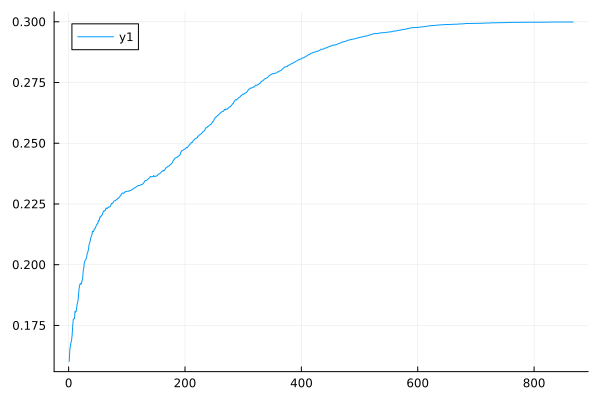

In [197]:
#plot(res_1.muts[5])
plot(res_1.r)

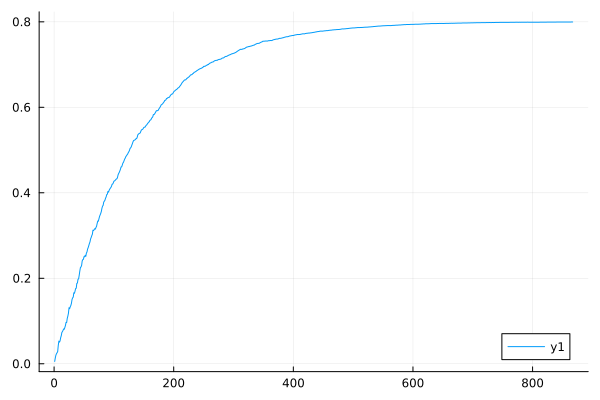

In [198]:
plot(res_1.muts[5])

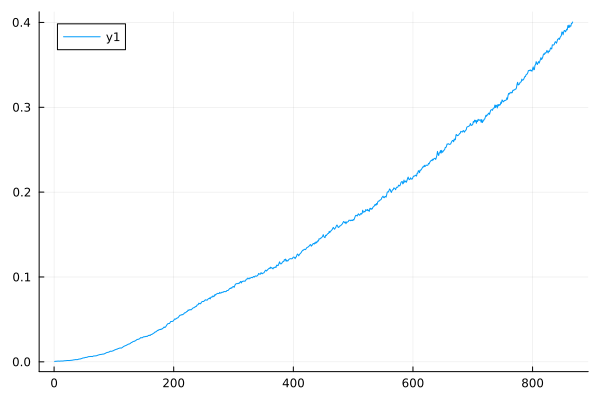

In [194]:
plot(res_1.tumor_density)

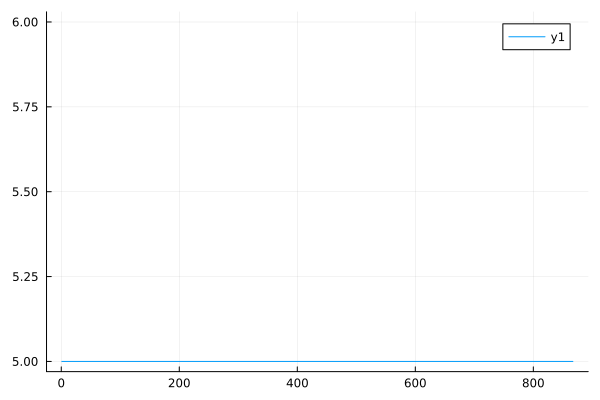

In [199]:
    plot(res_1.n_chrs)

In [268]:
aI_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_aI.txt")]
aO_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_aO.txt")]
aS_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_aS.txt")]
aM_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_aM.txt")]
#aHK_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_aHK.txt")]

nI_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_nI.txt")]
nO_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_nO.txt")]
nS_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_nS.txt")]
nM_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_nM.txt")]
nHK_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_nHK.txt")]

r_2ch = [parse.(Float64, strip.(split(s, ','))) for s in readlines("../Data/CancerEvo/2ch_r.txt")]

672-element Vector{Vector{Float64}}:
 [0.157, 0.157, 0.15875, 0.162, 0.162, 0.16633333333333333, 0.16574999999999998, 0.16555555555555557, 0.1654, 0.1668  …  0.2725, 0.2725, 0.2725, 0.276, 0.276, 0.276, 0.276, 0.276, 0.276, NaN]
 [0.1577, 0.1598, 0.1605, 0.1633, 0.16575, 0.16773333333333335, 0.16669230769230767, 0.16599999999999998, 0.1655, 0.166  …  0.2899278188746915, 0.28991909784560116, 0.2899231200268965, 0.28991902113459384, 0.28991904814855984, 0.2899184222321826, 0.2899171690109396, 0.28991025641025614, 0.2899099250307707, 0.2899092118390421]
 [0.157, 0.161, 0.1598, 0.16166666666666665, 0.16166666666666665, 0.16049999999999998, 0.164, 0.165, 0.16711111111111113, 0.16750000000000004  …  0.199, 0.199, 0.199, 0.199, 0.199, 0.206, 0.206, 0.206, 0.206, NaN]
 [0.157, 0.16011111111111112, 0.1605, 0.1619, 0.16225, 0.16225, 0.16225, 0.16527272727272727, 0.1659090909090909, 0.16574999999999998  …  0.17099999999999999, 0.17099999999999999, 0.17099999999999999, 0.17099999999999999, 0.17099

In [294]:
p_avg = plot([aI_2ch[2],aO_2ch[2],aS_2ch[2],aM_2ch[2], fill(0, length(nM_2ch[2]))], label=hcat("I","O","S","M","HK"), lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12), yguidefontsize=16, ylabel="Number of activated genes",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.9,0.85), grid=(1.5))
savefig("images/2ch_a.png")

"/home/ubuntu/CancerEvo/images/2ch_a.png"

In [296]:
p_avg = plot([nI_2ch[21],nO_2ch[21],nS_2ch[21],nM_2ch[21],nHK_2ch[21]], label=hcat("I","O","S","M","HK"), lw=2,
     xtickfont = font(12), xguidefontsize=16, xlabel="Time",
     ytickfont = font(12), yguidefontsize=16, ylabel="Number of alleles",#ylabel="Average number act. genes",
     legendfontsize=11, legend=(0.9,0.55), grid=(1.5))
savefig("images/2ch_n.png")

"/home/ubuntu/CancerEvo/images/2ch_n.png"